In [157]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load
#
# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
#
# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
#
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
#
# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Import the libraries

In [223]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from scipy.stats import entropy
import time




# Load the data

In [159]:
# Load the data
train = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/unsupervised-learning-m2023/Train.csv')
test = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/unsupervised-learning-m2023/Test.csv')


In [160]:
# Check the shape of the data
print(train.shape)
print(test.shape)

(6840, 6252)
(68400, 127)


In [161]:
train.head()

,0,1,2,3,4,5,6,7,8,9,...,6242,6243,6244,6245,6246,6247,6248,6249,Sensor,Action_Person
0,8.130500,8.130500,8.160400,8.160300,8.160500,8.145400,8.145400,8.137600,8.130700,8.115500,...,7.846600,7.846700,7.802100,7.839200,7.861700,7.861600,7.802000,7.846500,T-xacc,a01_p1
1,1.034900,1.020200,1.020100,1.005200,1.027500,1.020100,1.049500,0.997440,1.064600,1.020200,...,1.460400,1.467900,1.461100,1.460600,1.475300,1.445800,1.460900,1.460400,T-yacc,a01_p1
2,5.421700,5.384300,5.362200,5.377000,5.347300,5.391900,5.451800,5.511100,5.392100,5.421500,...,5.761100,5.723900,5.671300,5.723800,5.709100,5.679100,5.716000,5.768600,T-zacc,a01_p1
3,-0.009461,-0.009368,0.015046,0.006892,0.008811,0.007001,-0.005710,0.010574,-0.009296,0.005122,...,0.020671,-0.006414,-0.004528,-0.003532,0.000897,-0.000920,-0.006311,-0.011664,T-xgyro,a01_p1
4,0.001915,0.023485,0.014330,0.018045,0.030433,0.029523,0.014217,0.030563,0.030531,0.027022,...,-0.015156,-0.004303,0.001816,0.016999,-0.005484,-0.001802,0.012666,0.016080,T-ygyro,a01_p1


In [162]:
FINAL_ACTION_PERSON_TO_LABEL_DICT = {'a01_p1': 0, 'a01_p2': 1, 'a01_p3': 2, 'a01_p4': 3, 'a01_p5': 4, 'a01_p6': 5, 'a01_p7': 6, 'a01_p8': 7, 'a02_p1': 8, 'a02_p2': 9, 'a02_p3': 10, 'a02_p4': 11, 'a02_p5': 12, 'a02_p6': 13, 'a02_p7': 14, 'a02_p8': 15, 'a03_p1': 16, 'a03_p2': 17, 'a03_p3': 18, 'a03_p4': 19, 'a03_p5': 20, 'a03_p6': 21, 'a03_p7': 22, 'a03_p8': 23, 'a04_p1': 24, 'a04_p2': 25, 'a04_p3': 26, 'a04_p4': 27, 'a04_p5': 28, 'a04_p6': 29, 'a04_p7': 30, 'a04_p8': 31, 'a05_p1': 32, 'a05_p2': 33, 'a05_p3': 34, 'a05_p4': 35, 'a05_p5': 36, 'a05_p6': 37, 'a05_p7': 38, 'a05_p8': 39, 'a06_p1': 40, 'a06_p2': 41, 'a06_p3': 42, 'a06_p4': 43, 'a06_p5': 44, 'a06_p6': 45, 'a06_p7': 46, 'a06_p8': 47, 'a07_p1': 48, 'a07_p2': 49, 'a07_p3': 50, 'a07_p4': 51, 'a07_p5': 52, 'a07_p6': 53, 'a07_p7': 54, 'a07_p8': 55, 'a08_p1': 56, 'a08_p2': 57, 'a08_p3': 58, 'a08_p4': 59, 'a08_p5': 60, 'a08_p6': 61, 'a08_p7': 62, 'a08_p8': 63, 'a09_p1': 64, 'a09_p2': 65, 'a09_p3': 66, 'a09_p4': 67, 'a09_p5': 68, 'a09_p6': 69, 'a09_p7': 70, 'a09_p8': 71, 'a10_p1': 72, 'a10_p2': 73, 'a10_p3': 74, 'a10_p4': 75, 'a10_p5': 76, 'a10_p6': 77, 'a10_p7': 78, 'a10_p8': 79, 'a11_p1': 80, 'a11_p2': 81, 'a11_p3': 82, 'a11_p4': 83, 'a11_p5': 84, 'a11_p6': 85, 'a11_p7': 86, 'a11_p8': 87, 'a12_p1': 88, 'a12_p2': 89, 'a12_p3': 90, 'a12_p4': 91, 'a12_p5': 92, 'a12_p6': 93, 'a12_p7': 94, 'a12_p8': 95, 'a13_p1': 96, 'a13_p2': 97, 'a13_p3': 98, 'a13_p4': 99, 'a13_p5': 100, 'a13_p6': 101, 'a13_p7': 102, 'a13_p8': 103, 'a14_p1': 104, 'a14_p2': 105, 'a14_p3': 106, 'a14_p4': 107, 'a14_p5': 108, 'a14_p6': 109, 'a14_p7': 110, 'a14_p8': 111, 'a15_p1': 112, 'a15_p2': 113, 'a15_p3': 114, 'a15_p4': 115, 'a15_p5': 116, 'a15_p6': 117, 'a15_p7': 118, 'a15_p8': 119, 'a16_p1': 120, 'a16_p2': 121, 'a16_p3': 122, 'a16_p4': 123, 'a16_p5': 124, 'a16_p6': 125, 'a16_p7': 126, 'a16_p8': 127, 'a17_p1': 128, 'a17_p2': 129, 'a17_p3': 130, 'a17_p4': 131, 'a17_p5': 132, 'a17_p6': 133, 'a17_p7': 134, 'a17_p8': 135, 'a18_p1': 136, 'a18_p2': 137, 'a18_p3': 138, 'a18_p4': 139, 'a18_p5': 140, 'a18_p6': 141, 'a18_p7': 142, 'a18_p8': 143, 'a19_p1': 144, 'a19_p2': 145, 'a19_p3': 146, 'a19_p4': 147, 'a19_p5': 148, 'a19_p6': 149, 'a19_p7': 150, 'a19_p8': 151}
FINAL_ACTION_PERSON_TO_LABEL_DICT

{'a01_p1': 0,
 'a01_p2': 1,
 'a01_p3': 2,
 'a01_p4': 3,
 'a01_p5': 4,
 'a01_p6': 5,
 'a01_p7': 6,
 'a01_p8': 7,
 'a02_p1': 8,
 'a02_p2': 9,
 'a02_p3': 10,
 'a02_p4': 11,
 'a02_p5': 12,
 'a02_p6': 13,
 'a02_p7': 14,
 'a02_p8': 15,
 'a03_p1': 16,
 'a03_p2': 17,
 'a03_p3': 18,
 'a03_p4': 19,
 'a03_p5': 20,
 'a03_p6': 21,
 'a03_p7': 22,
 'a03_p8': 23,
 'a04_p1': 24,
 'a04_p2': 25,
 'a04_p3': 26,
 'a04_p4': 27,
 'a04_p5': 28,
 'a04_p6': 29,
 'a04_p7': 30,
 'a04_p8': 31,
 'a05_p1': 32,
 'a05_p2': 33,
 'a05_p3': 34,
 'a05_p4': 35,
 'a05_p5': 36,
 'a05_p6': 37,
 'a05_p7': 38,
 'a05_p8': 39,
 'a06_p1': 40,
 'a06_p2': 41,
 'a06_p3': 42,
 'a06_p4': 43,
 'a06_p5': 44,
 'a06_p6': 45,
 'a06_p7': 46,
 'a06_p8': 47,
 'a07_p1': 48,
 'a07_p2': 49,
 'a07_p3': 50,
 'a07_p4': 51,
 'a07_p5': 52,
 'a07_p6': 53,
 'a07_p7': 54,
 'a07_p8': 55,
 'a08_p1': 56,
 'a08_p2': 57,
 'a08_p3': 58,
 'a08_p4': 59,
 'a08_p5': 60,
 'a08_p6': 61,
 'a08_p7': 62,
 'a08_p8': 63,
 'a09_p1': 64,
 'a09_p2': 65,
 'a09_p3': 66,
 'a09

# Preprocess the data

In [163]:
train = train.dropna() # drop na values from train set
test = test.dropna() # drop na values from test set
print(train.shape)
print(test.shape)



(6840, 6252)
(68400, 127)


In [8]:
train_tmp_1 = train.select_dtypes(include=['float64'])
# train.iloc[0][:50]
train_tmp_1.head()

,0,1,2,3,4,5,6,7,8,9,...,6240,6241,6242,6243,6244,6245,6246,6247,6248,6249
0,8.130500,8.130500,8.160400,8.160300,8.160500,8.145400,8.145400,8.137600,8.130700,8.115500,...,7.831500,7.816700,7.846600,7.846700,7.802100,7.839200,7.861700,7.861600,7.802000,7.846500
1,1.034900,1.020200,1.020100,1.005200,1.027500,1.020100,1.049500,0.997440,1.064600,1.020200,...,1.430800,1.475200,1.460400,1.467900,1.461100,1.460600,1.475300,1.445800,1.460900,1.460400
2,5.421700,5.384300,5.362200,5.377000,5.347300,5.391900,5.451800,5.511100,5.392100,5.421500,...,5.768300,5.813200,5.761100,5.723900,5.671300,5.723800,5.709100,5.679100,5.716000,5.768600
3,-0.009461,-0.009368,0.015046,0.006892,0.008811,0.007001,-0.005710,0.010574,-0.009296,0.005122,...,0.000887,-0.015264,0.020671,-0.006414,-0.004528,-0.003532,0.000897,-0.000920,-0.006311,-0.011664
4,0.001915,0.023485,0.014330,0.018045,0.030433,0.029523,0.014217,0.030563,0.030531,0.027022,...,0.001833,0.021488,-0.015156,-0.004303,0.001816,0.016999,-0.005484,-0.001802,0.012666,0.016080


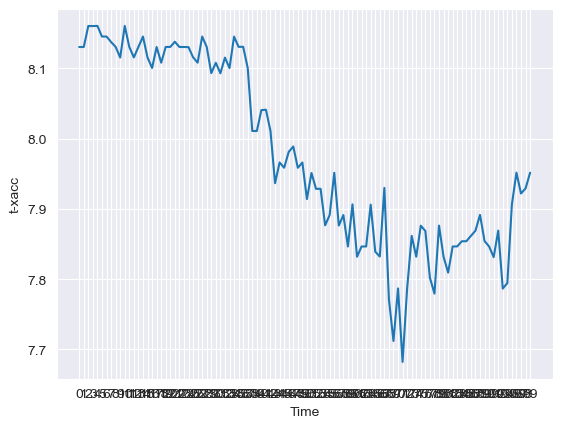

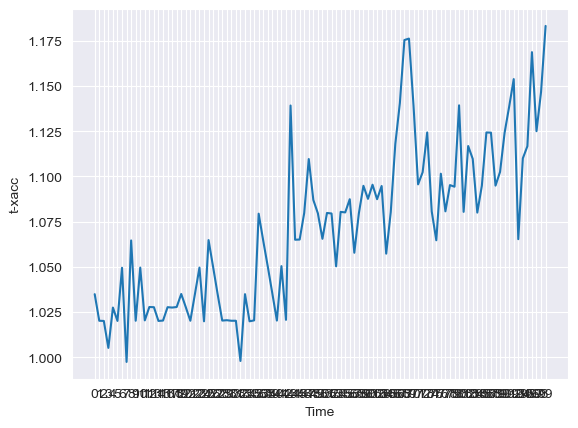

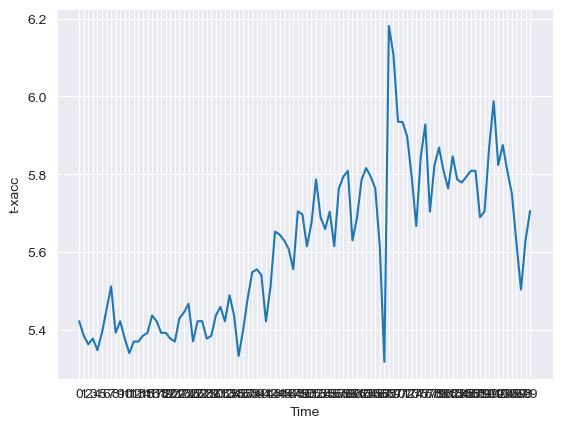

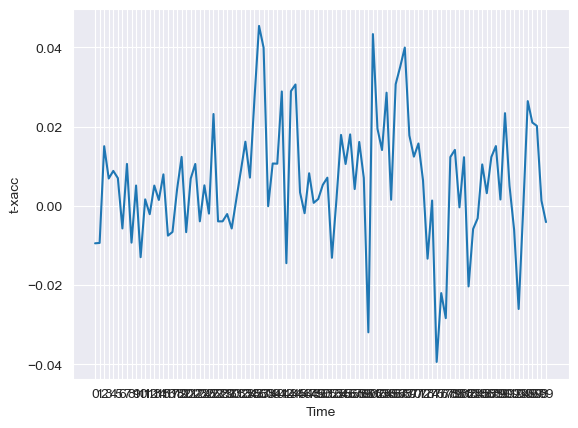

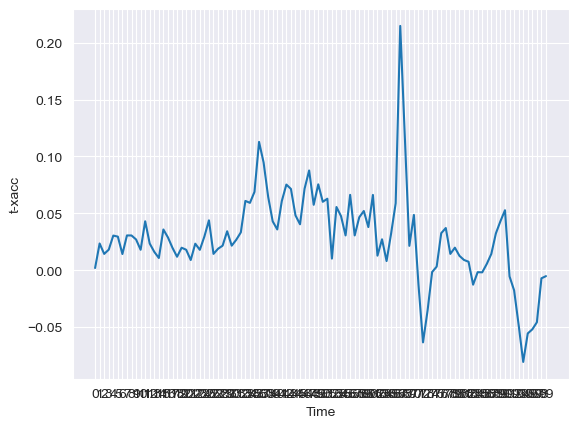

In [9]:
# plot how the signal values vary across 50 columns for t-xacc
for i in range(0, 5):
    plt.plot(train_tmp_1.iloc[i][:100])

    plt.xlabel('Time') # label the axes
    plt.ylabel('t-xacc') # label the axes

    plt.show() # show the plot

In [10]:
# # Perform label encoding for column number 6250
# le = LabelEncoder()
# train.iloc[:, 6250] = le.fit_transform(train.iloc[:, 6250])
#
# # Perform label encoding for column number 6251
# le = LabelEncoder()
# train.iloc[:, 6251] = le.fit_transform(train.iloc[:, 6251])
# # train.head()
#
# # For train_new
# # # Perform one hot encoding for column number 6250
# # ohe = OneHotEncoder()
# # train = ohe.fit_transform(train).toarray()
#
# # # Perform one hot encoding for column number 6251
# # ohe = OneHotEncoder()
# # train = ohe.fit_transform(train).toarray()
#
# Label Encoding

In [11]:
# count number of activities of each category in train set
x_view = train['Action_Person'].value_counts()
x_view = x_view.sort_index() # sort x_view in ascending order according to "Action_Person"
x_view

Action_Person
a01_p1    45
a01_p2    45
a01_p3    45
a01_p4    45
a01_p5    45
          ..
a19_p4    45
a19_p5    45
a19_p6    45
a19_p7    45
a19_p8    45
Name: count, Length: 152, dtype: int64

# Functions

In [12]:
def form_chunks(df):
    num_splits = 50
    step_size = 125

    new_data = []

    # Iterate over each row in the dataframe
    for index, row in df.iterrows():
        # Get the sensor and action person
        sensor = row['Sensor']
        action_person = row['Action_Person']

        # Get the data
        data = row[0:6250]

        # Split the data into 50 chunks of 125 values each
        chunks = np.array_split(data, num_splits)

        # Iterate over each chunk
        for chunk in chunks:
            # Get the chunk as a list
            chunk = chunk.tolist()

            # Add the sensor and action person to the chunk
            chunk.extend([sensor, action_person])

            # Add the chunk to the new data
            new_data.append(chunk)

    # Convert the new data to a dataframe
    new_df = pd.DataFrame(new_data)

    return new_df



In [13]:
# df_form_chunks_tmp = form_chunks(train)
# df_form_chunks_tmp.head()
# # save df_form_chunks_tmp to csv file


In [14]:
# df_form_chunks_tmp.to_csv('df_form_chunks_tmp.csv', index=False)

In [15]:
# write a function to find the number of peaks in a signal
from scipy.signal import find_peaks
def find_peaks_count(x):
    peaks, _ = find_peaks(x)
    return len(peaks)

# Autocorrelation
def mean(data):
    return sum(data) / len(data)

def autocorrelation(time_series, lag):
    N = len(time_series)
    mu = mean(time_series)

    numerator = sum((time_series[i] - mu) * (time_series[i + lag] - mu) for i in range(N - lag))
    denominator = sum((time_series[i] - mu) ** 2 for i in range(N))

    return numerator / denominator

def auto_corr_features(time_series, max_lag):
    acf_values = []
    for lag in range(max_lag + 1):
        acf = autocorrelation(time_series, lag)
        acf_values.append(acf)

    return acf_values



# Entropy
def calculate_entropy(data):
    return entropy(data)

# Zero-Crossing Rate
def zero_crossing_rate(data):
    return np.sum(np.abs(np.diff(np.sign(data)))) / (2 * len(data))


In [16]:
# Test usage:
time_series_tmp_1 = [1, 2, 3, 4, 5, 4, 3, 2, 1]
max_lag_tmp_1 = 5
acf_values_tmp_1 = auto_corr_features(time_series_tmp_1, max_lag_tmp_1)

print("Auto-correlation function values:")
print(acf_values_tmp_1)



Auto-correlation function values:
[1.0, 0.5396825396825397, -0.013492063492063475, -0.4666666666666665, -0.6269841269841269, -0.3015873015873015]


In [17]:
# # Remove outliers using LocalOutlierFactor
# from sklearn.neighbors import LocalOutlierFactor
# lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
# yhat = lof.fit_predict(train_new)
# train_new = train_new[yhat == 1]
# train_new.shape

In [18]:
## DON'T RUN
# # X = form_chunks(train)
# # X.shape, # X.head()
# # save X to csv file
# # X.to_csv('X.csv', index=False)
# # load data from X.csv
# # X = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/X.csv', index_col=0)


In [224]:
# load data from X_Transformed.csv
X = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/X_Transformed.csv')

# save X to csv file
# X.to_csv('X_Transformed.csv', index=True)

In [225]:
X.head()

,0,1,2,3,4,5,6,7,8,9,...,117,118,119,120,121,122,123,124,125,126
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,7.9515,7.9292,7.9367,7.9515,7.9442,7.9517,7.9743,7.9812,T-xacc,a01_p1
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,7.9214,7.8619,7.9512,7.9290,7.9067,7.9364,7.9067,7.8991,T-xacc,a01_p1
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,7.9663,7.9216,7.9216,7.9289,7.9290,7.9216,7.9439,7.9588,T-xacc,a01_p1
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,7.9066,7.9217,7.9219,8.0711,8.0104,7.7576,7.6901,7.8090,T-xacc,a01_p1
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,7.9665,7.9665,7.9964,7.9065,7.9369,8.0559,8.1305,8.0486,T-xacc,a01_p1


In [21]:
# extract unique sensors from X using column index 124
unique_sensor_list = X.iloc[:, 125].unique()
# extract unique action_person from X using column index 125
unique_action_person_list = X.iloc[:, 126].unique()
# unique_sensor_list
unique_sensor_list = list(unique_sensor_list)
unique_action_person_list = list(unique_action_person_list)
unique_action_person_list

['a01_p1',
 'a01_p2',
 'a01_p3',
 'a01_p4',
 'a01_p5',
 'a01_p6',
 'a01_p7',
 'a01_p8',
 'a02_p1',
 'a02_p2',
 'a02_p3',
 'a02_p4',
 'a02_p5',
 'a02_p6',
 'a02_p7',
 'a02_p8',
 'a03_p1',
 'a03_p2',
 'a03_p3',
 'a03_p4',
 'a03_p5',
 'a03_p6',
 'a03_p7',
 'a03_p8',
 'a04_p1',
 'a04_p2',
 'a04_p3',
 'a04_p4',
 'a04_p5',
 'a04_p6',
 'a04_p7',
 'a04_p8',
 'a05_p1',
 'a05_p2',
 'a05_p3',
 'a05_p4',
 'a05_p5',
 'a05_p6',
 'a05_p7',
 'a05_p8',
 'a06_p1',
 'a06_p2',
 'a06_p3',
 'a06_p4',
 'a06_p5',
 'a06_p6',
 'a06_p7',
 'a06_p8',
 'a07_p1',
 'a07_p2',
 'a07_p3',
 'a07_p4',
 'a07_p5',
 'a07_p6',
 'a07_p7',
 'a07_p8',
 'a08_p1',
 'a08_p2',
 'a08_p3',
 'a08_p4',
 'a08_p5',
 'a08_p6',
 'a08_p7',
 'a08_p8',
 'a09_p1',
 'a09_p2',
 'a09_p3',
 'a09_p4',
 'a09_p5',
 'a09_p6',
 'a09_p7',
 'a09_p8',
 'a10_p1',
 'a10_p2',
 'a10_p3',
 'a10_p4',
 'a10_p5',
 'a10_p6',
 'a10_p7',
 'a10_p8',
 'a11_p1',
 'a11_p2',
 'a11_p3',
 'a11_p4',
 'a11_p5',
 'a11_p6',
 'a11_p7',
 'a11_p8',
 'a12_p1',
 'a12_p2',
 'a12_p3',

In [22]:
type(unique_action_person_list)

list

In [23]:
# extract column 124 only from X
sensor_list_transformed_X = []
action_person_list_transformed_X = []
for i in range(0, X.shape[0]):
    sensor = X.iloc[i, 125]
    action_person = X.iloc[i, 126]
    sensor_list_transformed_X.append(sensor)
    action_person_list_transformed_X.append(action_person)

sensor_list_transformed_X

['T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-xacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',
 'T-yacc',

In [24]:
# action_person_list_transformed_X

In [25]:
len(sensor_list_transformed_X), len(action_person_list_transformed_X)

(342000, 342000)

In [26]:
# drop last two columns from X without using .drop() function
X_numeric = X.copy()
X_numeric = X_numeric.iloc[:, :-2]
X_numeric.head()

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,7.9664,7.9664,7.9515,7.9292,7.9367,7.9515,7.9442,7.9517,7.9743,7.9812
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,7.8918,7.9211,7.9214,7.8619,7.9512,7.9290,7.9067,7.9364,7.9067,7.8991
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,7.9589,7.9516,7.9663,7.9216,7.9216,7.9289,7.9290,7.9216,7.9439,7.9588
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,7.9068,7.9216,7.9066,7.9217,7.9219,8.0711,8.0104,7.7576,7.6901,7.8090
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,7.9215,7.9515,7.9665,7.9665,7.9964,7.9065,7.9369,8.0559,8.1305,8.0486


In [27]:
X_features = X_numeric.copy()
X_features.head()

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,7.9664,7.9664,7.9515,7.9292,7.9367,7.9515,7.9442,7.9517,7.9743,7.9812
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,7.8918,7.9211,7.9214,7.8619,7.9512,7.9290,7.9067,7.9364,7.9067,7.8991
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,7.9589,7.9516,7.9663,7.9216,7.9216,7.9289,7.9290,7.9216,7.9439,7.9588
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,7.9068,7.9216,7.9066,7.9217,7.9219,8.0711,8.0104,7.7576,7.6901,7.8090
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,7.9215,7.9515,7.9665,7.9665,7.9964,7.9065,7.9369,8.0559,8.1305,8.0486


In [28]:
# X_numeric.iloc[0, 0:125]
# np.mean(X_numeric.iloc[0, 0:125]) # should be the same as the first element in the code below
# X_numeric.iloc[:, 0:125].apply(lambda x: np.mean(x), axis=1)

In [29]:
X_features

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,8.13050,8.13050,8.16040,8.16030,8.16050,8.14540,8.14540,8.13760,8.13070,8.11550,...,7.96640,7.96640,7.95150,7.92920,7.93670,7.95150,7.94420,7.95170,7.97430,7.98120
1,7.96650,7.95160,7.98890,7.93670,7.93650,7.95160,7.95150,7.92900,7.92900,7.93640,...,7.89180,7.92110,7.92140,7.86190,7.95120,7.92900,7.90670,7.93640,7.90670,7.89910
2,7.89170,7.90650,7.86920,7.89170,7.89910,7.93660,7.89170,7.90680,7.92130,7.91400,...,7.95890,7.95160,7.96630,7.92160,7.92160,7.92890,7.92900,7.92160,7.94390,7.95880
3,7.93660,7.96650,7.90670,7.92180,7.95120,7.92910,7.90680,7.94390,7.92170,7.92160,...,7.90680,7.92160,7.90660,7.92170,7.92190,8.07110,8.01040,7.75760,7.69010,7.80900
4,7.89130,7.86960,7.86220,7.89200,7.90680,7.93690,7.97430,8.01130,7.98210,7.92870,...,7.92150,7.95150,7.96650,7.96650,7.99640,7.90650,7.93690,8.05590,8.13050,8.04860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341995,0.25692,0.23673,0.20053,0.19033,0.18537,0.19193,0.18792,0.17828,0.16634,0.15377,...,0.52607,0.54734,0.56559,0.57805,0.59021,0.59632,0.60219,0.60723,0.60366,0.59806
341996,0.58356,0.55854,0.52796,0.50620,0.48566,0.45589,0.44264,0.45035,0.46326,0.48904,...,0.34877,0.33321,0.32025,0.30282,0.28705,0.27140,0.26042,0.25389,0.25075,0.25214
341997,0.26064,0.27129,0.28111,0.29323,0.31242,0.33201,0.35263,0.36665,0.37498,0.38259,...,0.70858,0.68385,0.65827,0.65235,0.64888,0.62642,0.61853,0.62380,0.62952,0.63503
341998,0.65521,0.65040,0.62565,0.61310,0.59891,0.59667,0.61286,0.62667,0.65211,0.68637,...,0.57608,0.59485,0.60267,0.60461,0.60443,0.60352,0.61030,0.61936,0.62628,0.62266


# Feature Engineering Training Set

In [34]:
# calculate mean of each row upto column 125 and add it as a new column
X_features['mean'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.mean(x), axis=1)

# calculate standard deviation of each row upto column 125 and add it as a new column
# X_features['std'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.std(x), axis=1)

# calculate variance of each row upto column 125 and add it as a new column
X_features['var'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.var(x), axis=1)

# calculate maximum of each row upto column 125 and add it as a new column (same as calculating PEAK)
X_features['max'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.max(x), axis=1)

# calculate minimum of each row upto column 125 and add it as a new column
X_features['min'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.min(x), axis=1)

# calculate number of peaks of each row upto column 125 and add it as a new column using find_peaks_count function
X_features['peaks'] = X_numeric.iloc[:, 0:125].apply(lambda x: len(find_peaks(x)[0]), axis=1)

# calculate peak to peak distance of between each column of each row upto column 125 and add it as a new column


# calculate RMS of each row upto column 125 and add it as a new column
X_features['rms'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sqrt(np.mean(x**2)), axis=1)

# calculate average absolute deviation of each row upto column 125 and add it as a new column
# X_features['avg_abs_dev'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.mean(np.abs(x - np.mean(x))), axis=1)

# calculate median absolute deviation of each row upto column 125 and add it as a new column
# X_features['median_abs_dev'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.median(np.abs(x - np.median(x))), axis=1)

# calculate median of each row upto column 125 and add it as a new column
# X_features['median'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.median(x), axis=1)

# calculate interquartile range of each row upto column 125 and add it as a new column
# X_features['iqr'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25), axis=1)

# calculate negative value count of each row upto column 125 and add it as a new column
# X_features['neg_count'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x < 0), axis=1)

# calculate positive value count of each row upto column 125 and add it as a new column
X_features['pos_count'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x > 0), axis=1)

# calculate number of values above mean of each row upto column 125 and add it as a new column
X_features['above_mean'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x > np.mean(x)), axis=1)

# calculate number of values below mean of each row upto column 125 and add it as a new column
# X_features['below_mean'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x < np.mean(x)), axis=1)

# calculate energy of each row upto column 125 and add it as a new column where energy of a signal in every axis is computed by taking the mean of sum of squares of the values in a window in that particular axis.
X_features['energy'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x**2)/125, axis=1)


# calculate difference between max and min of each row upto column 125 and add it as a new column
# X_features['max-min'] = X_features['max'] - X_features['min']






In [35]:
# calculate skewness of each row upto column 125 and add it as a new column
X_features['skew'] = X_numeric.iloc[:, 0:125].apply(lambda x: stats.skew(x), axis=1)

# calculate kurtosis of each row upto column 125 and add it as a new column
X_features['kurt'] = X_numeric.iloc[:, 0:125].apply(lambda x: stats.kurtosis(x), axis=1)

# calculate jerk as The rate of change of body acceleration of each row upto column 125 and add it as a new column
# X_features['jerk'] = X_numeric.iloc[:, 0:125].apply(lambda x: np.mean(np.diff(x)), axis=1)

# calculate entropy of each row upto column 125 and add it as a new column
# X_features['entropy'] = X_numeric.iloc[:, 0:125].apply(lambda x: calculate_entropy(x), axis=1)

X_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,-1.019095
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,-0.927828
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,-0.917229
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,2.193103
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,6.944206


In [226]:
# load data from X_features.csv
X_features = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/X_features_11.csv')
X_features.head()


,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,-1.019095
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,-0.927828
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,-0.917229
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,2.193103
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,6.944206


In [31]:
# X_features_HERE_Copy = X_features.copy()

In [32]:
# type(X_numeric.iloc[0, 0:124])

In [ ]:
# sampling_rate = 25
# empty_list = []
# # calculate pitch, roll and yaw of each row upto column 125 by iterating over each row in the dataframe and add it to empty_list
# for i in range(0, X_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = X_numeric.iloc[i, 0:125]
#     # convert row to list
#     row = list(row)
#     # convert row to numpy array
#     row = np.array(row)
#     pitch = 0
#     roll = 0
#     yaw = 0
#
#     for i in range(0, len(row)):
#         dt = 1.0/sampling_rate
#         pitch += row[i] * dt
#         roll += row[i] * dt
#         yaw += row[i] * dt

In [34]:
# # calculate spectral entropy of each row upto column 125 by iterating over each row in the dataframe and add it to empty_list
# from scipy.stats import entropy
# from scipy.signal import spectrogram, welch
# sampling_frequency = 25
# spectral_entropy_list = []
# power_spectral_density_list = []
# for i in range(0, X_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = X_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate spectral entropy of row
#     f, Pxx = welch(row, sampling_frequency)
#     spectral_entropy = entropy(Pxx/np.sum(Pxx))
#     spectral_entropy_list.append(spectral_entropy)
#
#     # calculate spectral entropy of row
#     # f, Pxx = welch(row, sampling_frequency)
#
#     power_spectral_density_list.append(max(Pxx))
#
#
# spectral_entropy_list

/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 125, using nperseg = 125
  warnings.warn('nperseg = {0:d} is greater than input length '


[1.5970581855752919,
 1.796906203190321,
 1.797649680337377,
 3.153857397157988,
 3.2381782673960506,
 1.3885122774823022,
 2.1426911551540804,
 1.8164376757232048,
 1.4804754151187716,
 1.8790007818522598,
 2.739108351191478,
 3.3786517714417434,
 2.698275049061036,
 2.2405602787115364,
 2.758712197328464,
 2.5045837207155994,
 2.4406020892411386,
 3.0449521235786263,
 2.2564475143627245,
 1.7474562561620663,
 1.4826602275277736,
 2.1713020843952298,
 2.0956135195179866,
 1.6989588312428072,
 2.5174719376083288,
 3.137014184622217,
 2.5152199533049475,
 2.384226677828385,
 2.6717927282785796,
 2.466576864189567,
 2.20448367265477,
 2.9974866100917437,
 1.9751123496686445,
 2.225829505666169,
 3.5990236309305716,
 3.1431247091168224,
 2.284588066225162,
 1.9253680117557956,
 2.5915589316299283,
 1.6067761186667877,
 2.3485262849905806,
 3.170275994324944,
 1.7604026914067223,
 2.318938872385896,
 1.7264513730639626,
 1.4878894703867367,
 2.115714628384304,
 2.160083756118589,
 2.241349

In [35]:
# # add power_spectral_density_list to X_features
# X_features['power_spectral_density'] = power_spectral_density_list
# # add spectral_entropy_list to X_features
# X_features['spectral_entropy'] = spectral_entropy_list

In [36]:
# angle_list = []
# for i in range(0, X_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = X_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#
#     angle = 0
#     for i in range(0, len(row)):
#         dt = 1.0/sampling_frequency
#         angle += row[i] * dt
#
#
#     angle_list.append(angle)
#
# angle_list

In [405]:
# np.diff(X_numeric.iloc[0, 0:125])*25
# add angle_list to X_features
# X_features['angle'] = angle_list

In [37]:
# anglular_velocity_variance_list = []
# for i in range(0, X_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = X_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate angular velocity of row
#     angular_velocity = np.diff(row) * sampling_frequency
#
#     anglular_velocity_variance_list.append(np.var(angular_velocity))
#
#
# anglular_velocity_variance_list

In [406]:
# add anglular_velocity_variance_list to X_features
# X_features['anglular_velocity_variance'] = anglular_velocity_variance_list

In [38]:
# velocity_list = []
# acceleration_list = []
# jerk_list = []
# for i in range(0, X_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = X_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate velocity of row
#     velocity = np.diff(row) * sampling_frequency
#     velocity_list.append(np.mean(velocity))
#
#     # calculate acceleration of row
#     acceleration = np.diff(row, n=2) * (sampling_frequency**2)
#     acceleration_list.append(np.mean(acceleration))
#
#     # calculate jerk of row
#     jerk = np.diff(row, n=3) / (sampling_frequency**3)
#     jerk_list.append(np.mean(jerk))
#
#
#
# jerk_list

In [39]:
# type(jerk_list)
# len(jerk_list)

In [40]:
# view first 5 elements of jerk_list
# jerk_list[:5]

In [41]:
# # add velocity_list to X_features
# X_features['velocity'] = velocity_list
#
# # add acceleration_list to X_features
# X_features['acceleration'] = acceleration_list
#
# # add jerk_list to X_features
# X_features['jerk'] = jerk_list


In [42]:
# drop angle and anglular_velocity_variance columns from X_features
# X_features = X_features.drop(['angle', 'anglular_velocity_variance'], axis=1)
# X_features.head()


In [43]:
# save X_features to csv file
# X_features.to_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/X_features_13.csv', index=False)

In [44]:
# extract only features from X_features
X_features_check_corr = X_features.iloc[:, 125:]
X_features_check_corr.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt,power_spectral_density,spectral_entropy
0,7.975714,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,-1.019095,0.043646,1.597058
1,7.978250,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,-0.927828,0.023101,1.796906
2,7.970894,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,-0.917229,0.009149,1.797650
3,7.938412,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,2.193103,0.004423,3.153857
4,7.908930,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,6.944206,0.000822,3.238178


In [45]:
# drop columns with high correlation
# X_features_check_corr = X_features_check_corr.drop(['std', 'median_abs_dev', 'median', 'iqr', 'neg_count', 'below_mean', 'energy', 'min', 'avg_abs_dev'], axis=1)
# X_features_check_corr = X_features_FINAL.copy()
# drop last two columns from X_features_check_corr without using .drop() function
# X_features_check_corr = X_features_check_corr.iloc[:, :-2]
# X_features_check_corr.head()

In [ ]:
# check correlation between features using heatmap and save it to png file
plt.figure(figsize=(20, 20))
sns.heatmap(X_features_check_corr.corr(), annot=True, cmap='coolwarm')
plt.savefig('/Users/jyotir/DataspellProjects/Kaggle/Heatmaps/heatmap_tmp_features_TMP.png')
plt.show()

In [47]:
# auto_corr_features(list(X_features.iloc[0, 0:125]),10) == auto_corr_features(X_features.iloc[0, 0:125],10)

In [48]:
# # Auto Correlation Code
# # X_features.head()
# max_lag = 10
# auto_correlation_list = []
# for i in range(0, len(X_features)):
#
#     # extract row i from X_features
#     row = X_features.iloc[i, 0:125]
#     # row = list(row)
#     autocorr_values = auto_corr_features(row, max_lag)
#
#     # add autocorr_values to X_features
#     # X_features.iloc[i, len(X_features.columns):len(X_features.columns)+max_lag+1] = autocorr_values
#
#     # append autocorr_values to auto_correlation_list
#     auto_correlation_list.append(autocorr_values)


In [50]:
# load X_features from X_features.csv
# X_features = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/X_features.csv')
# X_features = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/X_features_13.csv')

In [227]:
X_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,-1.019095
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,-0.927828
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,-0.917229
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,2.193103
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,6.944206


In [228]:
# X_features.head()

In [69]:
# X_features.iloc[:, 134]

# Variability Check Function

In [52]:
# write a function to measure variability of a column for a specfic action_person and sensor class
def measure_variability(df, column_index, sensor, action_person):

    # get all rows for a specific sensor and action_person class
    df = df.loc[(df['Sensor'] == sensor) & (df['Action_Person'] == action_person)]

    # calculate coefficient of variation of the column
    cv = df.iloc[:, column_index].std()/df.iloc[:, column_index].mean()

    return cv


def print_dataset_subset(df, column_index_start, sensor, action_person):

    # get all rows for a specific sensor and action_person class
    df = df.loc[(df['Sensor'] == sensor) & (df['Action_Person'] == action_person)]

    return df.iloc[:, column_index_start:]

# write a function to calculate variability of each column for each specfic action_person and sensor class for entire dataset and store it in a dataframe
def measure_variability_df(df, column_index_start, column_index_end, sensor_list, action_person_list):

    # extract column names from df using column_index_start
    column_names = df.columns[column_index_start:column_index_end]

    # create a dataframe to store variability of each column for each specfic action_person and sensor class
    variability_df = pd.DataFrame(columns=column_names)


    # iterate over each column
    for i in range(column_index_start, column_index_end):

        # iterate over each sensor and action_person class
        for sensor, action_person in zip(sensor_list, action_person_list):

            # calculate coefficient of variation of each column for each action_person class and store it in variability_df
            variability_df.loc[sensor + '_' + action_person, df.columns[i]] = measure_variability(df, i, sensor, action_person)

    return variability_df





In [ ]:
X_features_measure_variability = X_features.copy()
# add sensor and action_person columns to X_features_measure_variability
X_features_measure_variability['Sensor'] = sensor_list_transformed_X
X_features_measure_variability['Action_Person'] = action_person_list_transformed_X
X_features_measure_variability.head()

In [54]:
# len(X_features_measure_variability.columns)
variability_df = measure_variability_df(X_features_measure_variability, 125,len(X_features_measure_variability.columns)-2,unique_sensor_list, unique_action_person_list)
variability_df

/var/folders/jh/_t8scx1x6w94mv1mjlpmy5xr0000gn/T/ipykernel_18155/2960403387.py:8: RuntimeWarning: invalid value encountered in scalar divide
  cv = df.iloc[:, column_index].std()/df.iloc[:, column_index].mean()


,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt,power_spectral_density,spectral_entropy
T-xacc_a01_p1,0.006662,0.702489,0.00822,0.010115,0.052719,0.006666,0.0,0.131473,0.013344,1.533277,-32.031689,1.051693,0.241453
T-yacc_a01_p2,-0.309634,2.107074,-1.074506,-0.330898,0.089659,0.299641,3.319672,0.127475,0.536371,771.42848,3.307272,2.704931,0.098803
T-zacc_a01_p3,0.027756,0.997423,0.052343,0.041705,0.059299,0.02775,0.0,0.135748,0.055626,-5.312967,3.771886,1.787115,0.134389
T-xgyro_a01_p4,13.51391,0.977999,0.650627,-0.437291,0.067703,0.362414,0.105151,0.059538,0.97007,-3.587906,1.511283,1.251819,0.067677
T-ygyro_a01_p5,0.09745,0.281601,0.160866,-0.421236,0.064285,0.079344,0.040625,0.062158,0.1628,-17.385206,2.207466,0.714387,0.063682
T-zgyro_a01_p6,-0.252224,0.265363,0.281971,-0.222539,0.066166,0.115114,0.152363,0.059229,0.240064,6.209654,3.359039,0.716691,0.031165
T-xmag_a01_p7,-0.014012,5.483826,-0.016502,-0.014054,0.086194,0.01401,NaN,0.109596,0.027994,4.201583,-2.143021,5.770659,0.21694
T-ymag_a01_p8,-0.021353,0.471649,-0.026429,-0.025136,0.063051,0.021369,NaN,0.178495,0.043579,-14.788546,0.614454,1.978565,0.058012
T-zmag_a02_p1,-0.084055,0.803415,-0.095942,-0.082715,0.119577,0.084001,NaN,0.160988,0.168334,10.633674,-1.070981,1.04762,0.269911
RA-xacc_a02_p2,0.004135,2.03991,0.01286,0.016954,0.074775,0.004111,0.0,0.081132,0.008199,27.279448,1.548354,1.290612,0.040729


In [55]:
# measure_variability(X_features_measure_variability, 124, "T-xacc", "a01_p1")
# print_dataset_subset(X_features_measure_variability, 124, "T-yacc", "a01_p1")

In [56]:
# # calculate coefficient of variation of each column for each action_person class and print it
# for i in range(124, 144):
#
#
#     # print column name and measure_variability for each column
#     print(X_features.columns[i], measure_variability(X_features, i, "T-xacc", "a01_p1"))


# Feature Engineering Testing Set

In [229]:
test_numeric = test.copy()
# drop last two columns from test_numeric without using .drop() function
test_numeric = test_numeric.iloc[:, :-2]
test_features = test_numeric.copy()
test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.003584,0.008056,0.025315,0.004389,0.003512,0.004473,-0.001946,0.010838,-0.012944,-0.015867
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,-0.463700,-0.486350,-0.502250,-0.506890,-0.507520,-0.502950,-0.498900,-0.495870,-0.493780,-0.490370
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,-0.466180,0.346540,0.503220,0.929130,0.997340,1.140400,1.022900,0.596410,0.047012,0.103940
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,-0.896860,-1.067700,-0.882290,-1.045300,-0.897400,-0.941900,-1.105600,-0.867400,-1.037300,-0.926990
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,-0.585560,-0.547390,-0.507830,-0.466720,-0.427060,-0.388320,-0.363050,-0.342670,-0.366050,-0.425750


In [46]:
# calculate mean of each row upto column 125 and add it as a new column for test set
test_features['mean'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.mean(x), axis=1)

# calculate variance of each row upto column 125 and add it as a new column
test_features['var'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.var(x), axis=1)

# calculate maximum of each row upto column 125 and add it as a new column
test_features['max'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.max(x), axis=1)

# calculate minimum of each row upto column 125 and add it as a new column
test_features['min'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.min(x), axis=1)


# calculate number of peaks of each row upto column 125 and add it as a new column using find_peaks_count function
test_features['peaks'] = test_numeric.iloc[:, 0:125].apply(lambda x: len(find_peaks(x)[0]), axis=1)

# calculate peak to peak distance of between each column of each row upto column 125 and add it as a new column


# calculate RMS of each row upto column 125 and add it as a new column
test_features['rms'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.sqrt(np.mean(x**2)), axis=1)

# calculate positive value count of each row upto column 125 and add it as a new column
test_features['pos_count'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x > 0), axis=1)

# calculate number of values above mean of each row upto column 125 and add it as a new column
test_features['above_mean'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x > np.mean(x)), axis=1)

# calculate energy of each row upto column 125 and add it as a new column where energy of a signal in every axis is computed by taking the mean of sum of squares of the values in a window in that particular axis.
test_features['energy'] = test_numeric.iloc[:, 0:125].apply(lambda x: np.sum(x**2)/125, axis=1)



In [47]:
# calculate skewness of each row upto column 125 and add it as a new column
test_features['skew'] = test_numeric.iloc[:, 0:125].apply(lambda x: stats.skew(x), axis=1)

# calculate kurtosis of each row upto column 125 and add it as a new column
test_features['kurt'] = test_numeric.iloc[:, 0:125].apply(lambda x: stats.kurtosis(x), axis=1)

# calculate jerk as The rate of change of body acceleration of each row upto column 125 and add it as a new column
# test_features['jerk'] = test_features.iloc[:, 0:125].apply(lambda x: np.mean(np.diff(x)), axis=1)

# calculate entropy of each row upto column 125 and add it as a new column
# test_features['entropy'] = test_features.iloc[:, 0:125].apply(lambda x: calculate_entropy(x), axis=1)

test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,-0.102649
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,1.384139
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,-0.414547
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,-0.418504
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,-1.361171


In [230]:
# load data from test_features.csv
test_features = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/test_features_11.csv')
test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,-0.102649
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,1.384139
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,-0.414547
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,-0.418504
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,-1.361171


In [223]:
# test_features_HERE_Copy = test_features.copy()

In [59]:
# sampling_frequency = 25
# spectral_entropy_list_test = []
# power_spectral_density_list_test = []
# for i in range(0, test_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = test_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate spectral entropy of row
#     f, Pxx = welch(row, sampling_frequency)
#     spectral_entropy = entropy(Pxx/np.sum(Pxx))
#     spectral_entropy_list_test.append(spectral_entropy)
#
#     power_spectral_density_list_test.append(max(Pxx))
#
#
# spectral_entropy_list_test

/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 125, using nperseg = 125
  warnings.warn('nperseg = {0:d} is greater than input length '


[3.4741513792252423,
 1.9235259569707965,
 2.500622526206214,
 3.1718354507364666,
 1.1325503144416518,
 3.6907882653110535,
 2.0658551751567202,
 2.3758883639565584,
 2.0162704783517316,
 3.5156617629658244,
 1.1206893201862063,
 1.642576105406768,
 3.277967576964098,
 3.3361363037525975,
 3.628220876496659,
 2.943188830857398,
 3.831430216022086,
 3.351138423742657,
 3.2852429452721372,
 1.7050309275813473,
 2.4517644808105494,
 3.1630744171527647,
 3.201229529373108,
 3.324444142037376,
 1.3580096613711095,
 3.383379933200417,
 2.112299854034007,
 3.5375902406368978,
 2.1359714573480537,
 2.038291410242538,
 1.3925948199073042,
 1.3688953354291125,
 2.60494489167516,
 2.740758123893052,
 3.4989541337290926,
 3.679174089871152,
 3.459534302937729,
 2.135497452813725,
 3.451951698066311,
 3.7013383021477857,
 3.7692271592793363,
 1.3514420712258284,
 1.1078538042391748,
 3.098864185166515,
 2.7909857738958364,
 2.5412673102179975,
 3.893754055575767,
 2.7374854491233127,
 1.9979108025

In [60]:
# # add spectral_entropy_list to test_features
# test_features['spectral_entropy'] = spectral_entropy_list_test
#
# # add power_spectral_density_list to test_features
# test_features['power_spectral_density'] = power_spectral_density_list_test

In [470]:
# velocity_list_test = []
# acceleration_list_test = []
# jerk_list_test = []
# for i in range(0, test_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = test_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate velocity of row
#     velocity = np.diff(row) * sampling_frequency
#     velocity_list_test.append(np.mean(velocity))
#
#     # calculate acceleration of row
#     acceleration = np.diff(row, n=2) * (sampling_frequency**2)
#     acceleration_list_test.append(np.mean(acceleration))
#
#     # calculate jerk of row
#     jerk = np.diff(row, n=3) / (sampling_frequency**3)
#     jerk_list_test.append(np.mean(jerk))
#
#
#
# jerk_list_test

[9.038163934426192e-09,
 5.10426229508198e-09,
 4.023218360655744e-07,
 1.620616393442624e-07,
 -2.859540983606552e-08,
 -7.196327868852462e-07,
 -1.2800000000000107e-09,
 -4.0015737704918034e-07,
 -9.122622950818988e-09,
 -1.5480236065573682e-07,
 2.9471475409836123e-07,
 -6.4157377049179925e-09,
 -2.8154754098360515e-07,
 1.4234229508196783e-07,
 2.7331147540984397e-10,
 -1.832813114754091e-06,
 -2.8170491803280097e-08,
 -6.4443593442622825e-06,
 -1.429339278688524e-05,
 -1.0806557377049536e-09,
 2.4493114754098252e-08,
 -4.258045901639297e-07,
 -3.436065573770481e-08,
 -3.5507409836065673e-07,
 8.865573770491737e-09,
 1.9357377049179964e-08,
 2.5043934426229462e-08,
 1.4426229508197615e-08,
 1.155777049180329e-06,
 3.789114754098372e-07,
 -8.078688524590388e-10,
 9.679790163934413e-07,
 6.195829508196733e-08,
 1.0491803278688263e-09,
 -1.484590163934425e-09,
 5.718032786885383e-09,
 9.714780327868833e-07,
 -3.878295081967178e-09,
 1.8219016393442385e-09,
 7.015407213114773e-07,
 -1.

In [471]:
# # add jerk_list_test to test_features
# test_features['jerk'] = jerk_list_test
# # add velocity_list_test to test_features
# test_features['velocity'] = velocity_list_test
# # add acceleration_list_test to test_features
# test_features['acceleration'] = acceleration_list_test

In [472]:
# drop angle and anglular_velocity_variance columns from test_features
# test_features = test_features.drop(['angle', 'anglular_velocity_variance'], axis=1)
# test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,pos_count,above_mean,energy,skew,kurt,spectral_entropy,power_spectral_density,jerk,velocity,acceleration
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,48,60,0.000150,0.155794,-0.102649,3.474151,0.000090,9.038164e-09,-0.002079,-0.014842
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0,59,0.257866,0.953609,1.384139,1.923526,0.000769,5.104262e-09,0.003254,0.004522
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,67,62,0.247407,0.387921,-0.414547,2.500623,0.173054,4.023218e-07,-0.206827,-0.570996
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0,59,0.914843,-0.156339,-0.418504,3.171835,0.001986,1.620616e-07,0.014821,0.525661
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0,59,0.380682,0.297006,-1.361171,1.132550,0.056192,-2.859541e-08,0.070385,-0.418598


In [407]:
# angle_list_test = []
# for i in range(0, test_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = test_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#
#     angle = 0
#     for i in range(0, len(row)):
#         dt = 1.0/sampling_frequency
#         angle += row[i] * dt
#
#
#     angle_list_test.append(angle)
#
# angle_list_test
#


[-0.012646839999999998,
 -2.5368936,
 0.4836556000000002,
 -4.774308799999998,
 -2.9867611999999992,
 31.710078799999998,
 -3.268384800000002,
 5.210920640000001,
 -0.4268172400000002,
 -0.11478023999999998,
 -0.14598064000000013,
 -1.1869553999999995,
 43.49956400000001,
 0.24317168000000006,
 -0.00914004,
 -50.7722838,
 46.65334800000001,
 -6.77815552,
 -7.446131359999997,
 -2.7779284000000004,
 -0.30286952,
 0.3178436400000001,
 -9.509456000000002,
 -0.06058372000000022,
 -1.0700046799999994,
 47.96589999999999,
 -1.8788720000000003,
 -48.60830799999999,
 44.593152,
 -46.102864000000004,
 -2.0132403999999995,
 -0.7950800799999995,
 -0.019975479999999997,
 -2.3879368000000003,
 -1.3958903999999994,
 37.157151999999996,
 -4.489917559999999,
 0.6410653199999996,
 -0.004043519999999999,
 0.04256006999999992,
 -2.3272687999999997,
 1.2494841199999998,
 0.27705872000000037,
 20.093119599999998,
 -33.486563999999994,
 47.10094400000001,
 8.062512340000003,
 15.384711999999988,
 -56.7476561

In [409]:
# add angle_list_test to test_features
# test_features['angle'] = angle_list_test

In [408]:
# anglular_velocity_variance_list_test = []
# for i in range(0, test_numeric.shape[0]):
#     # extract row i from X_numeric
#     row = test_numeric.iloc[i, 0:125]
#
#     row = list(row) # convert row to list
#     row = np.array(row) # convert row to numpy array
#
#     # calculate angular velocity of row
#     angular_velocity = np.diff(row) * sampling_frequency
#
#     anglular_velocity_variance_list_test.append(np.var(angular_velocity))
#
#
# anglular_velocity_variance_list_test

[0.10218228626056843,
 0.04350353829019249,
 39.849955532940946,
 5.442677595323067,
 0.9436975195556387,
 1139.2222939550759,
 1.5947086094359717,
 568.1187851735639,
 69.14649402962571,
 59.56024635680639,
 926.2982498139664,
 0.6739075751495839,
 6.854553511966713,
 319.9236174600226,
 0.061115849248626106,
 15833.61355663543,
 0.21191081067898374,
 15044.960878494616,
 10248.804995562488,
 0.0009498502699011397,
 9.145986694666199,
 5275.495477327228,
 2.123194108919745,
 1376.8169295578962,
 0.2147339577871358,
 0.4661982797866821,
 0.2267090659957077,
 0.2412277705515102,
 2853.9806831897117,
 621.6756496012456,
 0.020693044074369154,
 356.82115168869143,
 4.633685406671559,
 0.0005153186581360603,
 0.0007646569654006245,
 0.2028064873829346,
 2914.6291391778263,
 0.3406316956046354,
 0.08358542106025624,
 1167.6013091855157,
 0.0005703859057947481,
 0.36821370539590914,
 133.85603157710523,
 2442.680658881406,
 77.0365593619927,
 847.9204012779658,
 13114.411515753893,
 0.771946

In [410]:
# add anglular_velocity_variance_list_test to test_features
# test_features['anglular_velocity_variance'] = anglular_velocity_variance_list_test

In [62]:
# save test_features to csv file
# test_features.to_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/test_features_13.csv', index=False)

In [231]:
test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,-0.102649
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,1.384139
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,-0.414547
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,-0.418504
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,-1.361171


In [232]:
# load test_features from test_features.csv
test_features = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/test_features_11.csv')
test_features.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,-0.102649
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,1.384139
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,-0.414547
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,-0.418504
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,-1.361171


In [233]:
test_features.shape[1] == X_features.shape[1]

True

In [67]:
# # Auto Correlation Code
# max_lag = 10
# auto_correlation_list_test = []
# for i in range(0, len(test_features)):
#
#     # extract row i from X_features
#     row = test_features.iloc[i, 0:125]
#     # row = list(row)
#     autocorr_values = auto_corr_features(row, max_lag)
#
#     # add autocorr_values to X_features
#     # X_features.iloc[i, len(X_features.columns):len(X_features.columns)+max_lag+1] = autocorr_values
#
#     # append autocorr_values to auto_correlation_list
#     auto_correlation_list_test.append(autocorr_values)


# FFT Code

In [68]:
# convert first half of the signals from time domain to frequency domain using FFT using lambda function
X_fft = X_numeric.copy()
# X_fft = X_numeric.iloc[:, 0:125].apply(lambda x: np.abs(np.fft.fft(x)))
# X_fft = X_numeric.iloc[:, 0:125].apply(lambda x: np.fft.fft(x)) # to get complex values

# X_fft = X_fft.drop(X_fft.iloc[:, 63:125], axis=1) # drop columns from 63 to 125
X_fft.shape #.iloc[0,0:125]

(342000, 125)

In [128]:
def calculate_fft_features_FINAL(row, num_features=60):
    fft_result = np.abs(np.fft.fft(row))
    return fft_result[:num_features]

# Apply the function to each row to add 10 FFT features
num_fft_features = 100
for i in range(num_fft_features):
    X_fft[f'FFT_{i}'] = X_fft.iloc[:, 0:125].apply(lambda row: calculate_fft_features_FINAL(row, num_features=num_fft_features)[i], axis=1)

/var/folders/jh/_t8scx1x6w94mv1mjlpmy5xr0000gn/T/ipykernel_14731/112717948.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_fft[f'FFT_{i}'] = X_fft.iloc[:, 0:125].apply(lambda row: calculate_fft_features_FINAL(row, num_features=num_fft_features)[i], axis=1)


In [129]:
X_fft.head()

,0,1,2,3,4,5,6,7,8,9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.215233,0.288701,0.107779,0.550261,0.569950,0.248589,0.288474,0.228941,0.323089,0.049184
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.161422,0.259443,0.427962,0.631145,0.290260,0.356846,0.584685,0.676357,0.469509,0.615618
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.291177,0.302236,0.265377,0.105921,0.131445,0.739889,0.347281,0.258125,0.082046,0.396886
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.216620,0.454901,0.664414,0.252672,0.583070,0.910142,1.471453,0.630256,0.596373,0.936678
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.335898,0.194898,0.378906,0.188855,0.082124,0.410321,0.397659,0.454262,0.465548,0.667656


In [130]:
# keep only last 10 columns
X_fft = X_fft.iloc[:, 125:]
X_fft.head()

,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,996.9643,9.666240,1.568899,0.767884,1.068505,1.995355,0.702969,0.433404,0.850263,0.596228,...,0.215233,0.288701,0.107779,0.550261,0.569950,0.248589,0.288474,0.228941,0.323089,0.049184
1,997.2812,6.428833,2.430362,1.015020,1.263887,0.471838,0.404185,0.819379,0.125459,0.463060,...,0.161422,0.259443,0.427962,0.631145,0.290260,0.356846,0.584685,0.676357,0.469509,0.615618
2,996.3617,4.226515,1.441549,0.188068,0.506063,0.520032,0.041368,0.354703,0.196871,0.248057,...,0.291177,0.302236,0.265377,0.105921,0.131445,0.739889,0.347281,0.258125,0.082046,0.396886
3,992.3015,2.843812,1.352425,0.351981,0.728914,1.011964,0.669194,0.704757,0.244105,0.506071,...,0.216620,0.454901,0.664414,0.252672,0.583070,0.910142,1.471453,0.630256,0.596373,0.936678
4,988.6162,1.839532,0.925161,0.574614,0.426568,0.393549,0.373807,0.721115,0.740414,0.425120,...,0.335898,0.194898,0.378906,0.188855,0.082124,0.410321,0.397659,0.454262,0.465548,0.667656


In [238]:
# load data from X_fft.csv
X_fft = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/X_fft_only_100.csv')

In [239]:
X_fft.head()

,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,996.9643,9.666240,1.568899,0.767884,1.068505,1.995355,0.702969,0.433404,0.850263,0.596228,...,0.215233,0.288701,0.107779,0.550261,0.569950,0.248589,0.288474,0.228941,0.323089,0.049184
1,997.2812,6.428833,2.430362,1.015020,1.263887,0.471838,0.404185,0.819379,0.125459,0.463060,...,0.161422,0.259443,0.427962,0.631145,0.290260,0.356846,0.584685,0.676357,0.469509,0.615618
2,996.3617,4.226515,1.441549,0.188068,0.506063,0.520032,0.041368,0.354703,0.196871,0.248057,...,0.291177,0.302236,0.265377,0.105921,0.131445,0.739889,0.347281,0.258125,0.082046,0.396886
3,992.3015,2.843812,1.352425,0.351981,0.728914,1.011964,0.669194,0.704757,0.244105,0.506071,...,0.216620,0.454901,0.664414,0.252672,0.583070,0.910142,1.471453,0.630256,0.596373,0.936678
4,988.6162,1.839532,0.925161,0.574614,0.426568,0.393549,0.373807,0.721115,0.740414,0.425120,...,0.335898,0.194898,0.378906,0.188855,0.082124,0.410321,0.397659,0.454262,0.465548,0.667656


In [131]:
# save X_fft to csv file
# X_fft.to_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/X_fft_only_100.csv', index=False)

In [56]:
# print first row
# X_fft.iloc[1, 0]

In [57]:
# calculate mean of first row
# np.mean(X_fft.iloc[0, 0:63])
# X_fft.iloc[0, 0:63]

In [58]:
# # calculate FFT mean of each row and add it as a new column using lambda function
# X_fft['fft_mean'] = X_fft.iloc[:, 0:63].apply(lambda x: np.mean(x), axis=1)
#
# # calculate FFT standard deviation of each row and add it as a new column using lambda function
# X_fft['fft_std'] = X_fft.iloc[:, 0:63].apply(lambda x: np.std(x), axis=1)
#
# # calculate FFT average absolute deviation of each row and add it as a new column using lambda function
# X_fft['fft_avg_abs_dev'] = X_fft.iloc[:, 0:63].apply(lambda x: np.mean(np.abs(x - np.mean(x))), axis=1)
#
# # calculate FFT median absolute deviation of each row and add it as a new column using lambda function
# X_fft['fft_median_abs_dev'] = X_fft.iloc[:, 0:63].apply(lambda x: np.median(np.abs(x - np.median(x))), axis=1)
#
# # calculate FFT minimum of each row and add it as a new column using lambda function
# X_fft['fft_min'] = X_fft.iloc[:, 0:63].apply(lambda x: np.min(x), axis=1)
#
# # calculate FFT maximum of each row and add it as a new column using lambda function
# X_fft['fft_max'] = X_fft.iloc[:, 0:63].apply(lambda x: np.max(x), axis=1)
#
# # calculate FFT difference between max and min of each row and add it as a new column using lambda function
# # X_fft['fft_max-min'] = X_fft['fft_max'] - X_fft['fft_min']
#
# # calculate FFT median of each row and add it as a new column using lambda function
# X_fft['fft_median'] = X_fft.iloc[:, 0:63].apply(lambda x: np.median(x), axis=1)
#
# # calculate FFT interquartile range of each row and add it as a new column using lambda function
# X_fft['fft_iqr'] = X_fft.iloc[:, 0:63].apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25), axis=1)
#
# # calculate FFT negative value count of each row and add it as a new column using lambda function
# X_fft['fft_neg_count'] = X_fft.iloc[:, 0:63].apply(lambda x: np.sum(x < 0), axis=1)
#
# # calculate FFT positive value count of each row and add it as a new column using lambda function
# X_fft['fft_pos_count'] = X_fft.iloc[:, 0:63].apply(lambda x: np.sum(x > 0), axis=1)
#
# # calculate FFT number of values above mean of each row and add it as a new column using lambda function
# X_fft['fft_above_mean'] = X_fft.iloc[:, 0:63].apply(lambda x: np.sum(x > np.mean(x)), axis=1)
#
# # calculate FFT number of values below mean of each row and add it as a new column using lambda function
# X_fft['fft_below_mean'] = X_fft.iloc[:, 0:63].apply(lambda x: np.sum(x < np.mean(x)), axis=1)
#
# # calculate FFT number of peaks of each row and add it as a new column using lambda function
# X_fft['fft_peaks'] = X_fft.iloc[:, 0:63].apply(lambda x: len(find_peaks(x)[0]), axis=1)
#
# # calculate FFT skewness of each row and add it as a new column using lambda function
# X_fft['fft_skew'] = X_fft.iloc[:, 0:63].apply(lambda x: stats.skew(x), axis=1)
#
# # calculate FFT kurtosis of each row and add it as a new column using lambda function
# X_fft['fft_kurt'] = X_fft.iloc[:, 0:63].apply(lambda x: stats.kurtosis(x), axis=1)
#
# # calculate FFT energy of each row and add it as a new column using lambda function where energy of a signal in every axis is computed by taking the mean of sum of squares of the values in a window in that particular axis.
# X_fft['fft_energy'] = X_fft.iloc[:, 0:63].apply(lambda x: np.sum(x**2)/63, axis=1)


In [59]:
# # TMP
# # only keep columns fft_std fft_max fft_iqr in X_fft
# X_fft = X_fft[['fft_max']]
# X_fft.head()
# X_fft_features_only = X_fft.copy()

In [60]:
# X_fft

In [236]:
test_fft = test_numeric.copy()
# calculate FFT of test set
# test_fft = test_fft.iloc[:, 0:125].apply(lambda x: np.abs(np.fft.fft(x)))
# drop columns from 63 to 125
# test_fft = test_fft.drop(test_fft.iloc[:, 63:125], axis=1)
test_fft.shape

(68400, 125)

In [133]:
num_fft_features_test = 60
for i in range(num_fft_features):
    test_fft[f'FFT_{i}'] = test_fft.iloc[:, 0:125].apply(lambda row: calculate_fft_features_FINAL(row, num_features=num_fft_features)[i], axis=1)

/var/folders/jh/_t8scx1x6w94mv1mjlpmy5xr0000gn/T/ipykernel_14731/2412747223.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_fft[f'FFT_{i}'] = test_fft.iloc[:, 0:125].apply(lambda row: calculate_fft_features_FINAL(row, num_features=num_fft_features)[i], axis=1)


In [ ]:
test_fft

In [135]:
# keep only last 10 columns from test_fft
test_fft = test_fft.iloc[:, 125:]
test_fft.head()

,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,0.316171,0.481516,0.235888,0.206684,0.301267,0.198386,0.180089,0.142567,0.190976,0.094143,...,0.059972,0.058146,0.142186,0.055046,0.112361,0.023377,0.065547,0.113544,0.116810,0.176844
1,63.422340,0.806540,0.546547,0.271960,0.126446,0.556396,0.362667,0.233555,0.233866,1.220799,...,0.014146,0.022974,0.006650,0.024390,0.023856,0.012998,0.014020,0.031941,0.021788,0.056909
2,12.091390,5.107543,5.485173,19.766282,11.266815,2.940304,13.920087,4.914253,5.292393,14.401886,...,0.473792,2.181844,0.925873,1.780376,1.340046,0.559854,1.956170,2.142424,2.100371,1.860504
3,119.357720,0.132982,1.644258,0.542818,0.631334,0.167316,0.080025,0.071638,0.142079,0.225983,...,0.252984,0.138138,0.409630,0.443087,0.609187,0.160845,0.147911,0.590159,0.314220,0.366343
4,74.669030,1.770446,1.705041,2.526851,7.664523,9.122744,2.990507,1.797488,1.322396,3.288134,...,0.207676,0.159224,0.205921,0.194607,0.284512,0.283604,0.274587,0.252244,0.504170,0.285064


In [240]:
# load data from test_fft.csv
test_fft = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/test_fft_only_100.csv')

In [241]:
test_fft.head()

,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,0.316171,0.481516,0.235888,0.206684,0.301267,0.198386,0.180089,0.142567,0.190976,0.094143,...,0.059972,0.058146,0.142186,0.055046,0.112361,0.023377,0.065547,0.113544,0.116810,0.176844
1,63.422340,0.806540,0.546547,0.271960,0.126446,0.556396,0.362667,0.233555,0.233866,1.220799,...,0.014146,0.022974,0.006650,0.024390,0.023856,0.012998,0.014020,0.031941,0.021788,0.056909
2,12.091390,5.107543,5.485173,19.766282,11.266815,2.940304,13.920087,4.914253,5.292393,14.401886,...,0.473792,2.181844,0.925873,1.780376,1.340046,0.559854,1.956170,2.142424,2.100371,1.860504
3,119.357720,0.132982,1.644258,0.542818,0.631334,0.167316,0.080025,0.071638,0.142079,0.225983,...,0.252984,0.138138,0.409630,0.443087,0.609187,0.160845,0.147911,0.590159,0.314220,0.366343
4,74.669030,1.770446,1.705041,2.526851,7.664523,9.122744,2.990507,1.797488,1.322396,3.288134,...,0.207676,0.159224,0.205921,0.194607,0.284512,0.283604,0.274587,0.252244,0.504170,0.285064


In [136]:
# save test_fft to csv file
# test_fft.to_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/test_fft_only_100.csv', index=False)

In [67]:
# TMP
# load data from test_fft.csv
# test_fft = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/test_fft.csv')
# test_fft

In [68]:
# TMP
# keep only columns fft_std fft_max fft_iqr in test_fft
# test_fft = test_fft[['fft_max']]
# test_fft.head()
# test_fft_features_only = test_fft.copy()

In [69]:
# # calculate S = np.abs(ft**2)/len(df) for each row in test_fft and add it as a new column using lambda function
# test_fft['S'] = test_fft.iloc[:, 0:125].apply(lambda x: np.abs(x**2)/125, axis=1)
#
# # calculate Max_f.append(np.max(S)) for each row in test_fft and add it as a new column using lambda function
# test_fft['Max_f'] = test_fft.iloc[:, 0:125].apply(lambda x: np.max(x), axis=1)
#
# # calculate Sum_f.append(np.sum(S)) for each row in test_fft and add it as a new column using lambda function
# test_fft['Sum_f'] = test_fft.iloc[:, 0:125].apply(lambda x: np.sum(x), axis=1)
#
# # calculate Mean_f.append(np.mean(S)) for each row in test_fft and add it as a new column using lambda function
# test_fft['Mean_f'] = test_fft.iloc[:, 0:125].apply(lambda x: np.mean(x), axis=1)
#
# # calculate Var_f.append(np.var(S)) for each row in test_fft and add it as a new column using lambda function
# test_fft['Var_f'] = test_fft.iloc[:, 0:125].apply(lambda x: np.var(x), axis=1)

In [70]:
# # calculate FFT mean of each row and add it as a new column using lambda function
# test_fft['fft_mean'] = test_fft.iloc[:, 0:63].apply(lambda x: np.mean(x), axis=1)
#
# # calculate FFT standard deviation of each row and add it as a new column using lambda function
# test_fft['fft_std'] = test_fft.iloc[:, 0:63].apply(lambda x: np.std(x), axis=1)
#
# # calculate FFT average absolute deviation of each row and add it as a new column using lambda function
# test_fft['fft_avg_abs_dev'] = test_fft.iloc[:, 0:63].apply(lambda x: np.mean(np.abs(x - np.mean(x))), axis=1)
#
# # calculate FFT median absolute deviation of each row and add it as a new column using lambda function
# test_fft['fft_median_abs_dev'] = test_fft.iloc[:, 0:63].apply(lambda x: np.median(np.abs(x - np.median(x))), axis=1)
#
# # calculate FFT minimum of each row and add it as a new column using lambda function
# test_fft['fft_min'] = test_fft.iloc[:, 0:63].apply(lambda x: np.min(x), axis=1)
#
# # calculate FFT maximum of each row and add it as a new column using lambda function
# test_fft['fft_max'] = test_fft.iloc[:, 0:63].apply(lambda x: np.max(x), axis=1)
#
# # calculate FFT difference between max and min of each row and add it as a new column using lambda function
# # test_fft['fft_max-min'] = test_fft['fft_max'] - test_fft['fft_min']
#
# # calculate FFT median of each row and add it as a new column using lambda function
# test_fft['fft_median'] = test_fft.iloc[:, 0:63].apply(lambda x: np.median(x), axis=1)
#
# # calculate FFT interquartile range of each row and add it as a new column using lambda function
# test_fft['fft_iqr'] = test_fft.iloc[:, 0:63].apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25), axis=1)
#
# # calculate FFT negative value count of each row and add it as a new column using lambda function
# test_fft['fft_neg_count'] = test_fft.iloc[:, 0:63].apply(lambda x: np.sum(x < 0), axis=1)
#
# # calculate FFT positive value count of each row and add it as a new column using lambda function
# test_fft['fft_pos_count'] = test_fft.iloc[:, 0:63].apply(lambda x: np.sum(x > 0), axis=1)
#
# # calculate FFT number of values above mean of each row and add it as a new column using lambda function
# test_fft['fft_above_mean'] = test_fft.iloc[:, 0:63].apply(lambda x: np.sum(x > np.mean(x)), axis=1)
#
# # calculate FFT number of values below mean of each row and add it as a new column using lambda function
# test_fft['fft_below_mean'] = test_fft.iloc[:, 0:63].apply(lambda x: np.sum(x < np.mean(x)), axis=1)
#
# # calculate FFT number of peaks of each row and add it as a new column using lambda function
# test_fft['fft_peaks'] = test_fft.iloc[:, 0:63].apply(lambda x: len(find_peaks(x)[0]), axis=1)
#
# # calculate FFT skewness of each row and add it as a new column using lambda function
# test_fft['fft_skew'] = test_fft.iloc[:, 0:63].apply(lambda x: stats.skew(x), axis=1)
#
# # calculate FFT kurtosis of each row and add it as a new column using lambda function
# test_fft['fft_kurt'] = test_fft.iloc[:, 0:63].apply(lambda x: stats.kurtosis(x), axis=1)
#
# # calculate FFT energy of each row and add it as a new column using lambda function where energy of a signal in every axis is computed by taking the mean of sum of squares of the values in a window in that particular axis.
# test_fft['fft_energy'] = test_fft.iloc[:, 0:63].apply(lambda x: np.sum(x**2)/63, axis=1)
#


In [ ]:
test_fft.head()

In [242]:
X_fft.shape[1] == test_fft.shape[1]

True

In [74]:
# X_features.head()
# X_fft.head()
# test_features.head()
# test_fft.head()
# X_fft
# test_fft

In [243]:
# add all new features from X_fft to X_fft_features_only
X_fft_features_only = X_fft.copy()
# X_fft_features_only = X_fft_features_only.iloc[:, 63:] # drop first 63 columns from X_fft_features_only without using .drop() function
X_fft_features_only.head()


,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,996.9643,9.666240,1.568899,0.767884,1.068505,1.995355,0.702969,0.433404,0.850263,0.596228,...,0.215233,0.288701,0.107779,0.550261,0.569950,0.248589,0.288474,0.228941,0.323089,0.049184
1,997.2812,6.428833,2.430362,1.015020,1.263887,0.471838,0.404185,0.819379,0.125459,0.463060,...,0.161422,0.259443,0.427962,0.631145,0.290260,0.356846,0.584685,0.676357,0.469509,0.615618
2,996.3617,4.226515,1.441549,0.188068,0.506063,0.520032,0.041368,0.354703,0.196871,0.248057,...,0.291177,0.302236,0.265377,0.105921,0.131445,0.739889,0.347281,0.258125,0.082046,0.396886
3,992.3015,2.843812,1.352425,0.351981,0.728914,1.011964,0.669194,0.704757,0.244105,0.506071,...,0.216620,0.454901,0.664414,0.252672,0.583070,0.910142,1.471453,0.630256,0.596373,0.936678
4,988.6162,1.839532,0.925161,0.574614,0.426568,0.393549,0.373807,0.721115,0.740414,0.425120,...,0.335898,0.194898,0.378906,0.188855,0.082124,0.410321,0.397659,0.454262,0.465548,0.667656


# FINAL FEATURE CODE

In [244]:
X_features_FINAL = X_features.copy()
X_features_FINAL.head()


,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,-1.019095
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,-0.927828
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,-0.917229
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,2.193103
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,6.944206


In [245]:
# add all new features from X_features_only to X_features_FINAL
X_features_FINAL = pd.concat([X_features_FINAL, X_fft_features_only], axis=1)
X_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.215233,0.288701,0.107779,0.550261,0.569950,0.248589,0.288474,0.228941,0.323089,0.049184
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.161422,0.259443,0.427962,0.631145,0.290260,0.356846,0.584685,0.676357,0.469509,0.615618
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.291177,0.302236,0.265377,0.105921,0.131445,0.739889,0.347281,0.258125,0.082046,0.396886
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.216620,0.454901,0.664414,0.252672,0.583070,0.910142,1.471453,0.630256,0.596373,0.936678
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.335898,0.194898,0.378906,0.188855,0.082124,0.410321,0.397659,0.454262,0.465548,0.667656


In [246]:
test_fft_features_only = test_fft.copy()
# test_fft_features_only = test_fft_features_only.iloc[:, 63:] # drop first 63 columns from test_fft_features_only without using .drop() function
test_fft_features_only.head()

,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,FFT_6,FFT_7,FFT_8,FFT_9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,0.316171,0.481516,0.235888,0.206684,0.301267,0.198386,0.180089,0.142567,0.190976,0.094143,...,0.059972,0.058146,0.142186,0.055046,0.112361,0.023377,0.065547,0.113544,0.116810,0.176844
1,63.422340,0.806540,0.546547,0.271960,0.126446,0.556396,0.362667,0.233555,0.233866,1.220799,...,0.014146,0.022974,0.006650,0.024390,0.023856,0.012998,0.014020,0.031941,0.021788,0.056909
2,12.091390,5.107543,5.485173,19.766282,11.266815,2.940304,13.920087,4.914253,5.292393,14.401886,...,0.473792,2.181844,0.925873,1.780376,1.340046,0.559854,1.956170,2.142424,2.100371,1.860504
3,119.357720,0.132982,1.644258,0.542818,0.631334,0.167316,0.080025,0.071638,0.142079,0.225983,...,0.252984,0.138138,0.409630,0.443087,0.609187,0.160845,0.147911,0.590159,0.314220,0.366343
4,74.669030,1.770446,1.705041,2.526851,7.664523,9.122744,2.990507,1.797488,1.322396,3.288134,...,0.207676,0.159224,0.205921,0.194607,0.284512,0.283604,0.274587,0.252244,0.504170,0.285064


In [247]:
test_features_FINAL = test_features.copy()
test_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,kurt
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,-0.102649
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,1.384139
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,-0.414547
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,-0.418504
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,-1.361171


In [248]:
# add all new features from test_fft_features_only to test_features_FINAL
test_features_FINAL = pd.concat([test_features_FINAL, test_fft_features_only], axis=1)
test_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.059972,0.058146,0.142186,0.055046,0.112361,0.023377,0.065547,0.113544,0.116810,0.176844
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.014146,0.022974,0.006650,0.024390,0.023856,0.012998,0.014020,0.031941,0.021788,0.056909
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.473792,2.181844,0.925873,1.780376,1.340046,0.559854,1.956170,2.142424,2.100371,1.860504
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.252984,0.138138,0.409630,0.443087,0.609187,0.160845,0.147911,0.590159,0.314220,0.366343
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.207676,0.159224,0.205921,0.194607,0.284512,0.283604,0.274587,0.252244,0.504170,0.285064


In [249]:
X_features_FINAL.shape[1] == test_features_FINAL.shape[1]

True

In [126]:
# X.head()
# X.iloc[:,125]

# Auto Correlation

In [250]:
# load auto_correlation_df from auto_correlation_df.csv
auto_correlation_df = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/AutoCorr/auto_correlation_df.csv')
# auto_correlation_df.head()
# drop the first column from auto_correlation_df
# auto_correlation_df = auto_correlation_df.iloc[:, 1:]
# auto_correlation_df.head()
# change the column names of auto_correlation_df to AutoCorrelation_i where i is the column number
auto_correlation_df.columns = ['AutoCorrelation_' + str(i-1) for i in range(1, len(auto_correlation_df.columns)+1)]
# auto_correlation_df.head()

In [251]:
# drop all columns except last 10 columns from auto_correlation_df
auto_correlation_df = auto_correlation_df.iloc[:, -10:]
# auto_correlation_df = auto_correlation_df.iloc[:, 1:4]
auto_correlation_df.head()

,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,0.932910,0.900759,0.891665,0.854347,0.827350,0.819424,0.802367,0.777559,0.766371,0.729199
1,0.866058,0.802512,0.844475,0.820077,0.774982,0.745170,0.721308,0.691743,0.680651,0.642666
2,0.860135,0.780179,0.815664,0.813010,0.745660,0.719196,0.723844,0.708756,0.661814,0.628832
3,0.523477,0.218112,0.213576,0.369768,0.329968,0.227149,0.196877,0.308727,0.342231,0.212600
4,0.620545,0.335270,0.273965,0.284965,0.261259,0.238978,0.224452,0.150328,0.104419,0.080829


In [252]:
# TEMP
# X_features_FINAL = X_features.copy() # X_features should not have Sensor and Action_Person columns

In [253]:
# TMP
# add auto_correlation features to X_features_FINAL
X_features_FINAL = pd.concat([X_features_FINAL, auto_correlation_df], axis=1)
X_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.932910,0.900759,0.891665,0.854347,0.827350,0.819424,0.802367,0.777559,0.766371,0.729199
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.866058,0.802512,0.844475,0.820077,0.774982,0.745170,0.721308,0.691743,0.680651,0.642666
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.860135,0.780179,0.815664,0.813010,0.745660,0.719196,0.723844,0.708756,0.661814,0.628832
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.523477,0.218112,0.213576,0.369768,0.329968,0.227149,0.196877,0.308727,0.342231,0.212600
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.620545,0.335270,0.273965,0.284965,0.261259,0.238978,0.224452,0.150328,0.104419,0.080829


In [254]:
# add sensor_list_transformed_X as a column number 124 to X_features_FINAL
X_features_PERM = X_features_FINAL.copy()
# save X_features_PERM to csv file
# X_features_PERM.to_csv('X_features_PERM.csv', index=False)
# X_features_PERM.head()

In [255]:
X_features_FINAL['Sensor'] = sensor_list_transformed_X
X_features_FINAL['Action_Person'] = action_person_list_transformed_X
X_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10,Sensor,Action_Person
0,8.1305,8.1305,8.1604,8.1603,8.1605,8.1454,8.1454,8.1376,8.1307,8.1155,...,0.891665,0.854347,0.827350,0.819424,0.802367,0.777559,0.766371,0.729199,T-xacc,a01_p1
1,7.9665,7.9516,7.9889,7.9367,7.9365,7.9516,7.9515,7.9290,7.9290,7.9364,...,0.844475,0.820077,0.774982,0.745170,0.721308,0.691743,0.680651,0.642666,T-xacc,a01_p1
2,7.8917,7.9065,7.8692,7.8917,7.8991,7.9366,7.8917,7.9068,7.9213,7.9140,...,0.815664,0.813010,0.745660,0.719196,0.723844,0.708756,0.661814,0.628832,T-xacc,a01_p1
3,7.9366,7.9665,7.9067,7.9218,7.9512,7.9291,7.9068,7.9439,7.9217,7.9216,...,0.213576,0.369768,0.329968,0.227149,0.196877,0.308727,0.342231,0.212600,T-xacc,a01_p1
4,7.8913,7.8696,7.8622,7.8920,7.9068,7.9369,7.9743,8.0113,7.9821,7.9287,...,0.273965,0.284965,0.261259,0.238978,0.224452,0.150328,0.104419,0.080829,T-xacc,a01_p1


In [256]:
X_features_FINAL.shape

(342000, 248)

In [257]:
# find list of unique sensors
sensors_list = X.iloc[:, 125].unique()
len(list(sensors_list)), type(sensors_list)
# sensors_list

(45, numpy.ndarray)

In [258]:
# TMP
# drop first 125 columns from X_features_FINAL
X_features_FINAL = X_features_FINAL.iloc[:, 125:]
X_features_FINAL.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,...,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10,Sensor,Action_Person
0,7.975714,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,...,0.891665,0.854347,0.827350,0.819424,0.802367,0.777559,0.766371,0.729199,T-xacc,a01_p1
1,7.978250,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,...,0.844475,0.820077,0.774982,0.745170,0.721308,0.691743,0.680651,0.642666,T-xacc,a01_p1
2,7.970894,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,...,0.815664,0.813010,0.745660,0.719196,0.723844,0.708756,0.661814,0.628832,T-xacc,a01_p1
3,7.938412,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,...,0.213576,0.369768,0.329968,0.227149,0.196877,0.308727,0.342231,0.212600,T-xacc,a01_p1
4,7.908930,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,...,0.273965,0.284965,0.261259,0.238978,0.224452,0.150328,0.104419,0.080829,T-xacc,a01_p1


In [259]:
X_features_FINAL.iloc[:, 121]

0          T-xacc
1          T-xacc
2          T-xacc
3          T-xacc
4          T-xacc
           ...   
341995    LL-zmag
341996    LL-zmag
341997    LL-zmag
341998    LL-zmag
341999    LL-zmag
Name: Sensor, Length: 342000, dtype: object

In [260]:
# split the dataset according to sensor and store in a dictionary
sensor_data_dict = {}
for sensor in sensors_list:
    sensor_data_dict[sensor] = X_features_FINAL[X_features_FINAL.iloc[:, 121] == sensor] # CATNOF (Change According To Number of Features)
    # drop last two columns from sensor_data_dict[sensor] without using .drop() function
    sensor_data_dict[sensor] = sensor_data_dict[sensor].iloc[:, :-2] # BE AWARE OF THIS
sensor_data_dict

{'T-xacc':             mean        var      max      min  peaks        rms  pos_count  \
 0       7.975714   0.014280   8.1605   7.6823     36   7.976610        125   
 1       7.978250   0.007490   8.1763   7.8472     35   7.978719        125   
 2       7.970894   0.003067   8.0860   7.8470     35   7.971086        125   
 3       7.938412   0.003733   8.1083   7.6901     34   7.938647        125   
 4       7.908930   0.001728   8.1305   7.8322     32   7.909039        125   
 ...          ...        ...      ...      ...    ...        ...        ...   
 339795  9.085391  10.578179  18.9300   3.3143     23   9.650001        125   
 339796  9.252281  19.140807  22.2310  -2.6208     28  10.234526        120   
 339797  9.733124   5.552316  22.4270   2.7824     28  10.014291        125   
 339798  9.298503  27.788829  29.7990  -3.2283     21  10.688825        118   
 339799  9.187627  56.590656  34.6720 -12.8920     28  11.874475        106   
 
         above_mean      energy      ske

In [261]:
### COMMON CODE FOR LABEL MAPPING
# split the dataset according to sensor and store in a dictionary
sensor_data_dict_Label = {}
for sensor in sensors_list:
    sensor_data_dict_Label[sensor] = X_features_FINAL[X_features_FINAL.iloc[:, 121] == sensor] # CATNOF (Change According To Number of Features)
    # drop last column from sensor_data_dict[sensor] without using .drop() function
    # sensor_data_dict_Label[sensor] = sensor_data_dict_Label[sensor].iloc[:, :-1]
sensor_data_dict_Label

{'T-xacc':             mean        var      max      min  peaks        rms  pos_count  \
 0       7.975714   0.014280   8.1605   7.6823     36   7.976610        125   
 1       7.978250   0.007490   8.1763   7.8472     35   7.978719        125   
 2       7.970894   0.003067   8.0860   7.8470     35   7.971086        125   
 3       7.938412   0.003733   8.1083   7.6901     34   7.938647        125   
 4       7.908930   0.001728   8.1305   7.8322     32   7.909039        125   
 ...          ...        ...      ...      ...    ...        ...        ...   
 339795  9.085391  10.578179  18.9300   3.3143     23   9.650001        125   
 339796  9.252281  19.140807  22.2310  -2.6208     28  10.234526        120   
 339797  9.733124   5.552316  22.4270   2.7824     28  10.014291        125   
 339798  9.298503  27.788829  29.7990  -3.2283     21  10.688825        118   
 339799  9.187627  56.590656  34.6720 -12.8920     28  11.874475        106   
 
         above_mean      energy      ske

# Training

In [262]:
X_features_FINAL.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,...,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10,Sensor,Action_Person
0,7.975714,0.014280,8.1605,7.6823,36,7.976610,125,55,63.626300,-0.023319,...,0.891665,0.854347,0.827350,0.819424,0.802367,0.777559,0.766371,0.729199,T-xacc,a01_p1
1,7.978250,0.007490,8.1763,7.8472,35,7.978719,125,50,63.659957,0.552416,...,0.844475,0.820077,0.774982,0.745170,0.721308,0.691743,0.680651,0.642666,T-xacc,a01_p1
2,7.970894,0.003067,8.0860,7.8470,35,7.971086,125,60,63.538212,0.100538,...,0.815664,0.813010,0.745660,0.719196,0.723844,0.708756,0.661814,0.628832,T-xacc,a01_p1
3,7.938412,0.003733,8.1083,7.6901,34,7.938647,125,56,63.022118,-0.231914,...,0.213576,0.369768,0.329968,0.227149,0.196877,0.308727,0.342231,0.212600,T-xacc,a01_p1
4,7.908930,0.001728,8.1305,7.8322,32,7.909039,125,42,62.552895,2.042285,...,0.273965,0.284965,0.261259,0.238978,0.224452,0.150328,0.104419,0.080829,T-xacc,a01_p1


In [263]:
X_features_FINAL.shape

(342000, 123)

In [264]:
# X_features_FINAL.iloc[:, 121].unique()

In [282]:
# apply KNN to each sensor data and store the cluster labels in a dictionary
sensor_knn_dict = {}
sensor_yknn_dict = {}
mapping_knn = {}
# list of accelerometer sensors
accelerometer_sensors_list = ['T-xacc', 'T-yacc', 'T-zacc', 'RA-xacc', 'RA-yacc', 'RA-zacc', 'LA-xacc', 'LA-yacc', 'LA-zacc', 'RL-xacc', 'RL-yacc', 'RL-zacc', 'LL-xacc', 'LL-yacc', 'LL-zacc']
# list of gyroscope sensors
gyroscope_sensors_list = ['T-xgyro', 'T-ygyro', 'T-zgyro', 'RA-xgyro', 'RA-ygyro', 'RA-zgyro', 'LA-xgyro', 'LA-ygyro', 'LA-zgyro', 'RL-xgyro', 'RL-ygyro', 'RL-zgyro', 'LL-xgyro', 'LL-ygyro', 'LL-zgyro']
# list of magnetometer sensors
magnetometer_sensors_list = ['T-xmag', 'T-ymag', 'T-zmag', 'RA-xmag', 'RA-ymag', 'RA-zmag', 'LA-xmag', 'LA-ymag', 'LA-zmag', 'RL-xmag', 'RL-ymag', 'RL-zmag', 'LL-xmag', 'LL-ymag', 'LL-zmag']

for sensor in sensors_list:

    nbrs = NearestNeighbors(n_neighbors=3)
    dataset = sensor_data_dict[sensor]

    # if sensor not in accelerometer_sensors_list:
    #     # drop 'jerk', 'velocity', 'acceleration' columns from dataset
    #     dataset = dataset.drop(['jerk', 'velocity', 'acceleration'], axis=1)

    # if sensor not in gyroscope_sensors_list:
    #     # drop angle and anglular_velocity_variance columns from dataset
    #     dataset = dataset.drop(['angle', 'anglular_velocity_variance'], axis=1)


    nbrs.fit(dataset)
    distances, indices = nbrs.kneighbors(dataset)

    mapping_knn[sensor] = {}
    dataset_with_label = sensor_data_dict_Label[sensor]

    for i in indices:

        mapping_example_dict = {}
        for j in i:
            action_person = dataset_with_label.iloc[j, 122] # CATNOF (Change According To Number of Features)
            final_value = FINAL_ACTION_PERSON_TO_LABEL_DICT[action_person]
            if final_value in mapping_example_dict:
                mapping_example_dict[final_value] += 1
            else:
                mapping_example_dict[final_value] = 1

        max_label = max(mapping_example_dict, key=mapping_example_dict.get)
        i_value = i[0]
        mapping_knn[sensor][i_value] = max_label



    sensor_knn_dict[sensor] = nbrs
    sensor_yknn_dict[sensor] = distances, indices


In [107]:
# for i in indices:
#     print(i)

In [108]:
# mapping_knn

In [266]:
# load auto_correlation_df_test from auto_correlation_df_test.csv
auto_correlation_df_test = pd.read_csv('/Users/jyotir/DataspellProjects/Kaggle/Features/Final/FINAL_SUB/AutoCorr/auto_correlation_df_test.csv')
# auto_correlation_df_test.head()
# drop the first column from auto_correlation_df_test
# auto_correlation_df_test = auto_correlation_df_test.iloc[:, 1:]
# auto_correlation_df_test.head()
# change the column names of auto_correlation_df_test to AutoCorrelation_i where i is the column number
auto_correlation_df_test.columns = ['AutoCorrelation_' + str(i-1) for i in range(1, len(auto_correlation_df_test.columns)+1)]
# auto_correlation_df_test.head()

In [267]:
# drop all columns except last 10 columns from auto_correlation_df_test
auto_correlation_df_test = auto_correlation_df_test.iloc[:, -10:]
# auto_correlation_df_test = auto_correlation_df_test.iloc[:, 1:4]
auto_correlation_df_test.head()

,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,0.430448,0.416808,0.289439,0.303391,0.304256,0.231256,0.158133,0.165237,0.111658,0.113637
1,0.917510,0.728794,0.472788,0.205738,-0.024495,-0.185959,-0.263953,-0.246749,-0.146211,0.012100
2,0.849074,0.555168,0.235277,-0.022069,-0.205424,-0.311513,-0.346378,-0.299861,-0.187584,-0.043240
3,-0.405254,0.275982,0.178832,-0.017907,0.223229,0.007165,0.125987,0.128536,-0.074317,0.186610
4,0.958215,0.858756,0.715949,0.543727,0.351018,0.146617,-0.059342,-0.256129,-0.433152,-0.581003


In [268]:
# TMP
# test_features_FINAL = test_features.copy()

In [269]:
test_features_FINAL.shape

(68400, 236)

In [270]:
test_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,FFT_90,FFT_91,FFT_92,FFT_93,FFT_94,FFT_95,FFT_96,FFT_97,FFT_98,FFT_99
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.059972,0.058146,0.142186,0.055046,0.112361,0.023377,0.065547,0.113544,0.116810,0.176844
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.014146,0.022974,0.006650,0.024390,0.023856,0.012998,0.014020,0.031941,0.021788,0.056909
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.473792,2.181844,0.925873,1.780376,1.340046,0.559854,1.956170,2.142424,2.100371,1.860504
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,0.252984,0.138138,0.409630,0.443087,0.609187,0.160845,0.147911,0.590159,0.314220,0.366343
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.207676,0.159224,0.205921,0.194607,0.284512,0.283604,0.274587,0.252244,0.504170,0.285064


In [271]:
# add auto_correlation features to test_features_FINAL
test_features_FINAL = pd.concat([test_features_FINAL, auto_correlation_df_test], axis=1)
test_features_FINAL.head()

,0,1,2,3,4,5,6,7,8,9,...,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,-0.005553,-0.005555,-0.001927,0.00362,-0.000057,-0.016367,-0.000747,-0.009958,-0.016365,-0.01098,...,0.430448,0.416808,0.289439,0.303391,0.304256,0.231256,0.158133,0.165237,0.111658,0.113637
1,-0.506510,-0.503990,-0.509880,-0.51366,-0.516020,-0.521940,-0.519750,-0.512000,-0.504350,-0.49535,...,0.917510,0.728794,0.472788,0.205738,-0.024495,-0.185959,-0.263953,-0.246749,-0.146211,0.012100
2,1.129800,1.299100,1.307800,1.03980,0.574590,0.116000,-0.169270,-0.109780,-0.094517,-0.26583,...,0.849074,0.555168,0.235277,-0.022069,-0.205424,-0.311513,-0.346378,-0.299861,-0.187584,-0.043240
3,-1.000500,-0.993640,-1.015500,-0.95595,-0.971360,-0.986350,-0.926550,-1.030600,-0.941640,-0.86113,...,-0.405254,0.275982,0.178832,-0.017907,0.223229,0.007165,0.125987,0.128536,-0.074317,0.186610
4,-0.774860,-0.752180,-0.711310,-0.65723,-0.621070,-0.587910,-0.541140,-0.483030,-0.423670,-0.38125,...,0.958215,0.858756,0.715949,0.543727,0.351018,0.146617,-0.059342,-0.256129,-0.433152,-0.581003


In [272]:
# drop first 125 columns from test_features_FINAL
test_features_FINAL = test_features_FINAL.iloc[:, 125:]
test_features_FINAL.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,...,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,-0.002529,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,...,0.430448,0.416808,0.289439,0.303391,0.304256,0.231256,0.158133,0.165237,0.111658,0.113637
1,-0.507379,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,...,0.917510,0.728794,0.472788,0.205738,-0.024495,-0.185959,-0.263953,-0.246749,-0.146211,0.012100
2,0.096731,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,...,0.849074,0.555168,0.235277,-0.022069,-0.205424,-0.311513,-0.346378,-0.299861,-0.187584,-0.043240
3,-0.954862,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,...,-0.405254,0.275982,0.178832,-0.017907,0.223229,0.007165,0.125987,0.128536,-0.074317,0.186610
4,-0.597352,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,...,0.958215,0.858756,0.715949,0.543727,0.351018,0.146617,-0.059342,-0.256129,-0.433152,-0.581003


In [273]:
# a, b = nbrs.kneighbors([test_features_FINAL.iloc[0, 0:138]])
# for i in b:
#     print(i[0])
# test_features_FINAL.iloc[0, 0:138].values.reshape(1, -1).shape

In [274]:
test_features_PERM = test_features_FINAL.copy()
test_features_PERM.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,...,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,-0.002529,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,...,0.430448,0.416808,0.289439,0.303391,0.304256,0.231256,0.158133,0.165237,0.111658,0.113637
1,-0.507379,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,...,0.917510,0.728794,0.472788,0.205738,-0.024495,-0.185959,-0.263953,-0.246749,-0.146211,0.012100
2,0.096731,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,...,0.849074,0.555168,0.235277,-0.022069,-0.205424,-0.311513,-0.346378,-0.299861,-0.187584,-0.043240
3,-0.954862,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,...,-0.405254,0.275982,0.178832,-0.017907,0.223229,0.007165,0.125987,0.128536,-0.074317,0.186610
4,-0.597352,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,...,0.958215,0.858756,0.715949,0.543727,0.351018,0.146617,-0.059342,-0.256129,-0.433152,-0.581003


In [207]:
# test.iloc[0, 125]
# test_features_FINAL.iloc[0, 0:121]

# stdev, energy, min

mean                  -0.002529
var                    0.000144
max                    0.027280
min                   -0.032883
peaks                 41.000000
                        ...    
AutoCorrelation_6      0.231256
AutoCorrelation_7      0.158133
AutoCorrelation_8      0.165237
AutoCorrelation_9      0.111658
AutoCorrelation_10     0.113637
Name: 0, Length: 121, dtype: float64

In [275]:
test_features_FINAL.head()

,mean,var,max,min,peaks,rms,pos_count,above_mean,energy,skew,...,AutoCorrelation_1,AutoCorrelation_2,AutoCorrelation_3,AutoCorrelation_4,AutoCorrelation_5,AutoCorrelation_6,AutoCorrelation_7,AutoCorrelation_8,AutoCorrelation_9,AutoCorrelation_10
0,-0.002529,0.000144,0.02728,-0.032883,41,0.012251,48,60,0.000150,0.155794,...,0.430448,0.416808,0.289439,0.303391,0.304256,0.231256,0.158133,0.165237,0.111658,0.113637
1,-0.507379,0.000433,-0.43248,-0.541400,15,0.507805,0,59,0.257866,0.953609,...,0.917510,0.728794,0.472788,0.205738,-0.024495,-0.185959,-0.263953,-0.246749,-0.146211,0.012100
2,0.096731,0.238050,1.30780,-0.701120,22,0.497400,67,62,0.247407,0.387921,...,0.849074,0.555168,0.235277,-0.022069,-0.205424,-0.311513,-0.346378,-0.299861,-0.187584,-0.043240
3,-0.954862,0.003082,-0.83760,-1.105600,45,0.956474,0,59,0.914843,-0.156339,...,-0.405254,0.275982,0.178832,-0.017907,0.223229,0.007165,0.125987,0.128536,-0.074317,0.186610
4,-0.597352,0.023853,-0.33019,-0.789360,9,0.616995,0,59,0.380682,0.297006,...,0.958215,0.858756,0.715949,0.543727,0.351018,0.146617,-0.059342,-0.256129,-0.433152,-0.581003


In [283]:
# apply KNN to each test data
y_pred = []

for i in range(0, len(test_features_FINAL)):

    # get sensor of test data
    sensor = test.iloc[i, 125]

    # get test data
    test_data_row = test_features_FINAL.iloc[i, 0:121] # CATNOF (Change According To Number of Features)

    # if sensor not in accelerometer_sensors_list:
    #     # drop 'jerk', 'velocity', 'acceleration' columns from test_data_row
    #     test_data_row = test_data_row.drop(['jerk', 'velocity', 'acceleration'])


    # if sensor not in gyroscope_sensors_list:
    #     # drop angle and anglular_velocity_variance columns from test_data_row
    #     test_data_row = test_data_row.drop(['angle', 'anglular_velocity_variance'])

    # reshape test data
    test_data_row = test_data_row.values.reshape(1, -1)

    # get nearest neighbors of test data
    distances, indices = sensor_knn_dict[sensor].kneighbors(test_data_row)

    # get mapping of indices to labels
    mapping_example_dict = {}
    for j in indices:
        for k in j:
            final_value = mapping_knn[sensor][k]
            if final_value in mapping_example_dict:
                mapping_example_dict[final_value] += 1
            else:
                mapping_example_dict[final_value] = 1


    max_label = max(mapping_example_dict, key=mapping_example_dict.get)
    y_pred.append(max_label)


/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/Users/jyotir/miniconda3/envs/Kaggle/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with featur

In [284]:
y_pred

[26,
 116,
 108,
 21,
 73,
 108,
 91,
 83,
 34,
 86,
 91,
 130,
 21,
 69,
 19,
 137,
 23,
 73,
 73,
 114,
 35,
 94,
 14,
 145,
 144,
 21,
 43,
 51,
 69,
 107,
 125,
 114,
 112,
 11,
 20,
 19,
 148,
 137,
 5,
 137,
 19,
 32,
 84,
 34,
 18,
 33,
 145,
 12,
 92,
 24,
 130,
 45,
 25,
 36,
 88,
 71,
 49,
 34,
 146,
 120,
 54,
 16,
 11,
 148,
 11,
 145,
 109,
 109,
 5,
 87,
 74,
 53,
 16,
 34,
 24,
 24,
 6,
 115,
 137,
 120,
 47,
 106,
 56,
 64,
 141,
 144,
 15,
 53,
 67,
 82,
 109,
 138,
 46,
 86,
 135,
 0,
 10,
 18,
 109,
 46,
 47,
 24,
 71,
 93,
 53,
 108,
 121,
 137,
 151,
 145,
 85,
 41,
 24,
 112,
 40,
 118,
 63,
 132,
 79,
 19,
 67,
 3,
 96,
 51,
 120,
 27,
 108,
 127,
 42,
 46,
 77,
 82,
 139,
 9,
 7,
 87,
 99,
 47,
 26,
 84,
 88,
 127,
 118,
 112,
 66,
 85,
 56,
 115,
 38,
 21,
 117,
 87,
 65,
 61,
 80,
 38,
 30,
 84,
 145,
 141,
 17,
 92,
 111,
 30,
 25,
 145,
 81,
 23,
 119,
 105,
 72,
 106,
 49,
 21,
 67,
 45,
 63,
 96,
 38,
 139,
 93,
 69,
 69,
 33,
 67,
 19,
 45,
 68,
 54,
 115

In [285]:
len(y_pred), len(np.unique(y_pred))

(68400, 152)

In [286]:
id_column = test['ID']
# id_column


In [288]:
# append y_pred to id_column
id_column = pd.DataFrame(id_column)
id_column['TARGET'] = y_pred
# save id_column to csv file
id_column.to_csv('submission_1.csv', index=False)


In [177]:
# sort id_column and target column according to ID
# id_column = id_column.sort_values(by=['ID'])
# id_column

In [182]:
# apply kmeans clustering to each sensor data and store the cluster labels in a dictionary
# sensor_kmean_dict = {}
# sensor_ykmeans_dict = {}
# for sensor in sensors_list:
#     kmeans = KMeans(n_clusters=152, max_iter=2000, n_init=20)
#     dataset = sensor_data_dict[sensor]
#     y_kmeans = kmeans.fit_predict(dataset)
#     sensor_kmean_dict[sensor] = kmeans
#     sensor_ykmeans_dict[sensor] = y_kmeans
#
#



# # apply Gaussian Mixture Model to each sensor data and store the cluster labels in a dictionary
# sensor_gmm_dict = {}
# sensor_ygmm_dict = {}
# for sensor in sensors_list:
#     gmm = GaussianMixture(n_components=152, max_iter=2000, n_init=20)
#     dataset = sensor_data_dict[sensor]
#     # start time counter
#     start = time.time()
#     y_gmm = gmm.fit_predict(dataset)
#     # end time counter
#     end = time.time()
#     # print the time taken
#     print("Time taken in seconds:", end - start)
#     sensor_gmm_dict[sensor] = gmm
#     sensor_ygmm_dict[sensor] = y_gmm

# # apply DBSCAN to each sensor data and store the cluster labels in a dictionary
# sensor_dbscan_dict = {}
# sensor_ydbscan_dict = {}
# for sensor in sensors_list:
#     from sklearn.cluster import DBSCAN
#     # DBSCAN for 152 clusters
#     dbscan = DBSCAN(eps=0.3, min_samples=10)
#     dataset = sensor_data_dict[sensor]
#     y_dbscan = dbscan.fit_predict(dataset)
#     sensor_dbscan_dict[sensor] = dbscan
#     sensor_ydbscan_dict[sensor] = y_dbscan
